# Transfer Learning for Computer Vision Tutorial
**Extended from [code](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html) by [Sasank Chilamkurthy](https://chsasank.github.io).**  
License: BSD.

In this tutorial, you will learn how to train a convolutional neural network for
image classification using transfer learning. You can read more about the transfer
learning at the [CS231N notes](https://cs231n.github.io/transfer-learning/).

Quoting these notes:

    In practice, very few people train an entire Convolutional Network
    from scratch (with random initialization), because it is relatively
    rare to have a dataset of sufficient size. Instead, it is common to
    pretrain a ConvNet on a very large dataset (e.g. ImageNet, which
    contains 1.2 million images with 1000 categories), and then use the
    ConvNet either as an initialization or a fixed feature extractor for
    the task of interest.

These two major transfer learning scenarios look as follows:

-  **Finetuning the convnet**: Instead of random initializaion, we
   initialize the network with a pretrained network, like the one that is
   trained on imagenet 1000 dataset. Rest of the training looks as
   usual.
-  **ConvNet as fixed feature extractor**: Here, we will freeze the weights
   for all of the network except that of the final fully connected
   layer. This last fully connected layer is replaced with a new one
   with random weights and only this layer is trained.




### Running notes
If you are running this in Google Colab, be sure to change the runtime to GPU by clicking `Runtime > Change runtime type` and selecting "GPU" from the dropdown menu.

### Import relevant packages

In [ ]:
%matplotlib inline

In [ ]:
import warnings
# warnings.filterwarnings("ignore", category=UserWarning)
# we want to find exif problematic images

In [ ]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

plt.ion()   # interactive mode

## Load Data

We will use `torchvision` and `torch.utils.data` packages for loading the
data.

The problem we're going to solve today is to train a model to classify
present and future **Israeli politicians**. We have about ~100 training images for each of our 9 politicians, scraped from the first page of the Google Images Search.
Usually, this is a very small dataset to generalize upon, if trained from scratch (or is it? We'll soon test this ourselves!). Since we are using transfer learning, we should be able to generalize reasonably well.

In [ ]:
# Create a folder for our data
!mkdir data
!mkdir data/israeli_politicians

In [ ]:
# Download our dataset and extract it
import requests
from zipfile import ZipFile

url = 'https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true'
r = requests.get(url, allow_redirects=True)
open('./data/israeli_politicians.zip', 'wb').write(r.content)

with ZipFile('./data/israeli_politicians.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall(path='./data/israeli_politicians/')

In [ ]:
#searching problem files and delete them
import glob, os
import PIL.Image

def get_files(folder, extension):
  for filename in glob.iglob('{}/**/*{}'.format(folder, extension), recursive=True):
    if os.path.isfile(filename):
        yield filename

for f in get_files("./data/israeli_politicians", "jpg"):
  with warnings.catch_warnings(record=True) as w:
     img = PIL.Image.open(f)
     exif_data = img._getexif()
     try:
       print(str(w[-1].message))
       print(f)
       os.remove(f)
     except:
       pass

Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
./data/israeli_politicians/val/gideon_saar/image523.jpg
Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
./data/israeli_politicians/train/naftali_bennett/image683.jpg


In [ ]:
# On Linux machines, the following simpler code can be used instead
# !wget https://github.com/omriallouche/ydata_deep_learning_2021/blob/main/data/israeli_politicians.zip?raw=true
# !unzip israeli_politicians.zip -d data/israeli_politicians/

### Datasets definition
PyTorch uses DataLoaders to define datasets. We'll create 2 data loaders, `train` and `val` (for validation).  
Our dataset was already split into different folders for these - as you can see under the "Files" menu on the left of the Colab.

In [ ]:
means = [0.485, 0.456, 0.406]
stds = [0.229, 0.224, 0.225]

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

In [ ]:
data_dir = r'./data/israeli_politicians/'

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print('dataset_sizes: ', dataset_sizes)

class_names = image_datasets['train'].classes
print('class_names:', class_names)

dataset_sizes:  {'train': 929, 'val': 234}
class_names: ['ayelet_shaked', 'benjamin_netanyahu', 'benny_gantz', 'danny_danon', 'gideon_saar', 'kostya_kilimnik', 'naftali_bennett', 'ofir_akunis', 'yair_lapid']


In [ ]:
# Check for the availability of a GPU, and use CPU otherwise
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

### Datasets and Dataloaders
Let's examine the dataloaders and datasets and learn more about their attributes and functions.  

In [ ]:
train_dataloader = dataloaders['train']

In Colab or Jupyter notebook, if we type  `train_dataloader.` and wait, we'd see a drop-down with the object attributes and functions.  

`train_dataloader.dataset.samples` contains the filenames + true labels (0 to 8 for our 9 classes).  
`train_dataloader.dataset.classes` contains the class names in order.  
`train_dataloader.dataset.class_to_idx` contains a map from a class name to the integer that represents it.

In [ ]:
train_dataloader.dataset.class_to_idx

{'ayelet_shaked': 0,
 'benjamin_netanyahu': 1,
 'benny_gantz': 2,
 'danny_danon': 3,
 'gideon_saar': 4,
 'kostya_kilimnik': 5,
 'naftali_bennett': 6,
 'ofir_akunis': 7,
 'yair_lapid': 8}

### Visualize a few images

Let's visualize a few training images so as to understand the data
augmentations.



In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array(means)
    std = np.array(stds)
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    fig = plt.figure(figsize=(5,3), dpi=300)
    plt.imshow(inp)
    if title is not None:
       plt.title(title, fontsize=5)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
# Get a batch of training data - the data loader is a generator
inputs, classes = next(iter(dataloaders['train']))

`inputs` is a tensor of shape `[16, 3, 256, 256]` - there are 16 images in the batch, each with 3 color channels (RGB), a width of 256 pixels, and a height of 256 pixels:

In [ ]:
inputs.shape

torch.Size([16, 3, 256, 256])

`classes` is a tensor of size 16, containing numbers matching the true class of each image, from our 9 classes.

In [ ]:
classes

tensor([6, 6, 3, 8, 1, 0, 5, 1, 1, 3, 4, 1, 1, 7, 0, 7])

To map it to the class names, we can run:

In [ ]:
[class_names[c] for c in classes]

['danny_danon',
 'ayelet_shaked',
 'ofir_akunis',
 'ofir_akunis',
 'benjamin_netanyahu',
 'gideon_saar',
 'benny_gantz',
 'ayelet_shaked',
 'ayelet_shaked',
 'naftali_bennett',
 'benjamin_netanyahu',
 'benny_gantz',
 'ayelet_shaked',
 'benjamin_netanyahu',
 'ayelet_shaked',
 'benny_gantz']

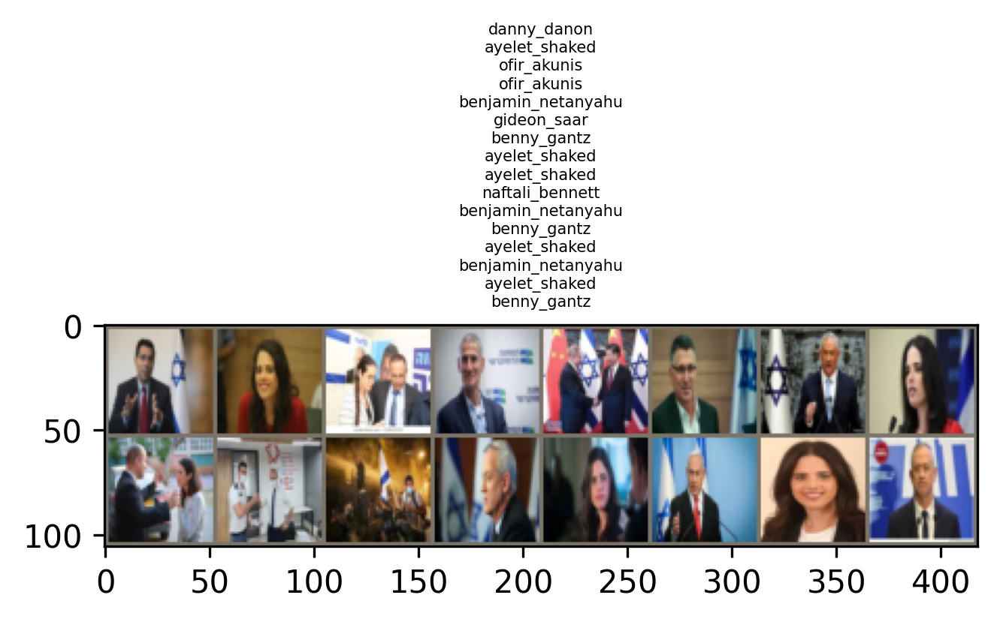

In [ ]:
# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=8)

imshow(out, title='\n'.join([class_names[x] for x in classes]))

### Using a pretrained model
Let's load a model pretrained on ImageNet, and use it for our task.  
The first time we load the model, it will be downloaded locally, and then cached for the future.

In [ ]:
# We load a pretrain model with its weights. Alternatively, one might want to only load the model architecture.
model = models.vgg16(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


We can print the model to learn about its structure:

In [ ]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Keras has a useful model summary, that we can also use for PyTorch models:

In [ ]:
!pip install torchsummary 
from torchsummary import summary
summary(model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

We can see above that the final layer is a fully connected layer, from 4096 neurons to 1000 neurons, with a total of `4096 * 1000 + 1000 = 4,097,000` parameters. We add 1000 weights for the bias term of each output neuron.  

So in total, VGG-16 has 138M parameters, and we've set them all to be trainable.

However, VGG-16 and other networks created for ImageNet all have 1,000 neurons in their output, since they classify images to one of the 1,000 categories in the ImageNet challenge.  
To use the network for our task, we need to replace the final fully-connected layer with one mapping to 9 neurons instead of 1000:

In [ ]:
# This code should output the number of input neurons to the final layer. We'll use it to create a new layer instead of it.
last_layer = list(model.children())[-1]
if hasattr(last_layer, 'in_features'):
  num_ftrs = last_layer.in_features
else:
  num_ftrs = last_layer[-1].in_features

num_ftrs

4096

To access and set a layer in the network, we reference it by name. In the example above, the final layer is `model.classifier[6]`.

In [ ]:
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model.classifier[6]

Linear(in_features=4096, out_features=1000, bias=True)

Let's now replace it with a linear layer with 4096 input features and 9 output features:

In [ ]:
model.classifier[6] = nn.Linear(in_features=4096, out_features=9)

Let's review our change in the model:

In [ ]:
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
summary(model.to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

Next, we define the loss, optimizer and LR scheduler.

In [ ]:
# If a GPU is available, make the model use it
model = model.to(device)

# For a multi-class problem, you'd usually prefer CrossEntropyLoss()
criterion = nn.CrossEntropyLoss()

# Use Stochastic Gradient Descent as the optimizer, with a learning rate of 0.001 and momentum
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

num_epochs = 10

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [ ]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Init variables that will save info about the best model
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                # Set model to training mode. 
                model.train()  
            else:
                # Set model to evaluate mode. In evaluate mode, we don't perform backprop and don't need to keep the gradients
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                # Prepare the inputs for GPU/CPU
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # ===== forward pass ======
                with torch.set_grad_enabled(phase=='train'):
                    # If we're in train mode, we'll track the gradients to allow back-propagation
                    outputs = model(inputs) # apply the model to the inputs. The output is the softmax probability of each class
                    _, preds = torch.max(outputs, 1) # 
                    loss = criterion(outputs, labels)

                    # ==== backward pass + optimizer step ====
                    # This runs only in the training phase
                    if phase == 'train':
                        loss.backward() # Perform a step in the opposite direction of the gradient
                        optimizer.step() # Adapt the optimizer

                # Collect statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
            if phase == 'train':
                # Adjust the learning rate based on the scheduler
                scheduler.step()  

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Keep the results of the best model so far
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                # deepcopy the model
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

## Finetuning the network




### Train and evaluate
It should take around 15-25 min on CPU. On GPU though, it takes less than a minute.

In [ ]:
model = train_model(model, 
                    dataloaders,
                       criterion, 
                       optimizer_ft, 
                       exp_lr_scheduler,
                       num_epochs=num_epochs)

Epoch 0/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 2.0808 Acc: 0.2347


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 2.0027 Acc: 0.2564

Epoch 1/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 1.8644 Acc: 0.3154


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.8259 Acc: 0.3504

Epoch 2/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 1.4465 Acc: 0.4962


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.7412 Acc: 0.4402

Epoch 3/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 1.1828 Acc: 0.5974


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.8135 Acc: 0.4103

Epoch 4/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 1.2587 Acc: 0.5748


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.4366 Acc: 0.5043

Epoch 5/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 0.5819 Acc: 0.8235


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.7536 Acc: 0.5427

Epoch 6/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 0.5722 Acc: 0.7955


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.7626 Acc: 0.5299

Epoch 7/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 0.2670 Acc: 0.9203


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.4694 Acc: 0.6026

Epoch 8/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 0.1459 Acc: 0.9591


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.5733 Acc: 0.6111

Epoch 9/9
----------


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 20 bytes but only got 19. Skipping tag 36867
  " Skipping tag %s" % (size, len(data), tag)


train Loss: 0.1093 Acc: 0.9709


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


val Loss: 1.6035 Acc: 0.6068

Training complete in 0m 23s
Best val Acc: 0.611111


### Visualizing the model predictions

Let's define a generic function to display our model's predictions for a few images:




In [ ]:
def visualize_model(model, num_images=6):    
    # Record the train/evaluate mode of the model, to restore it after we're done
    was_training = model.training
    # Set the model mode to evaluate
    model.eval()
    
    images_so_far = 0
    plt.figure(figsize=(2,1), dpi=300)

    with torch.no_grad(): # No need to collect gradients when generating predictions
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1

                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
                
        # Restore the model's train/evaluate mode
        model.train(mode=was_training)

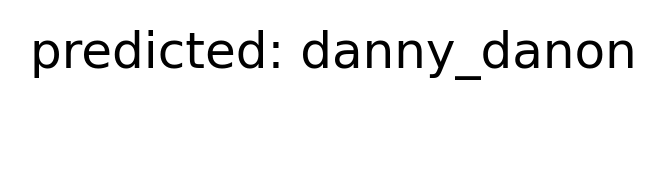

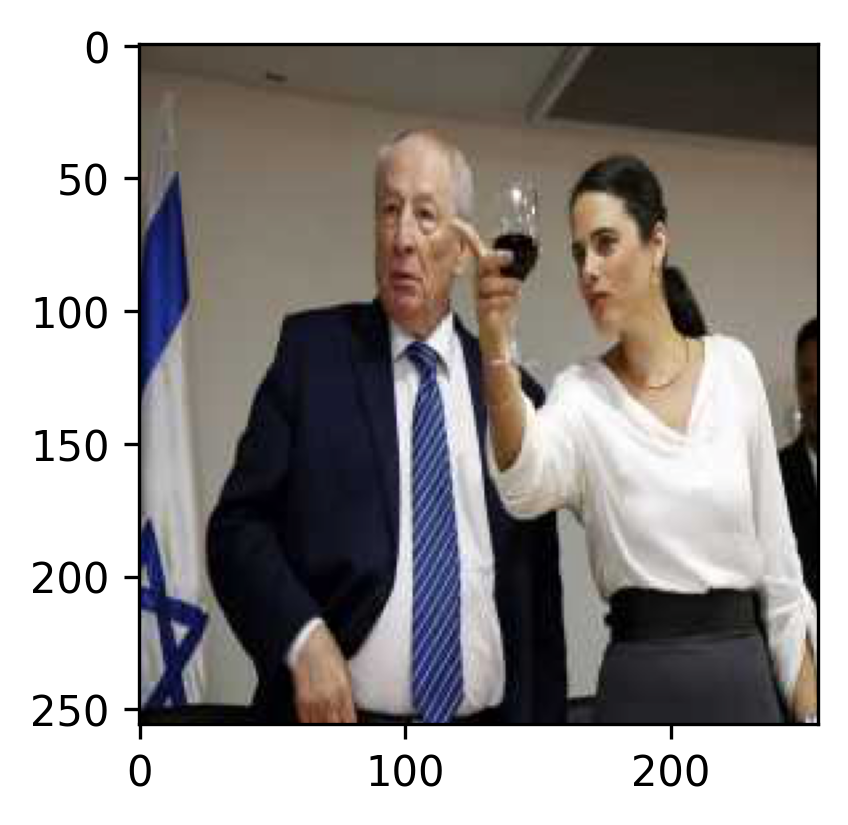

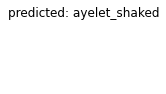

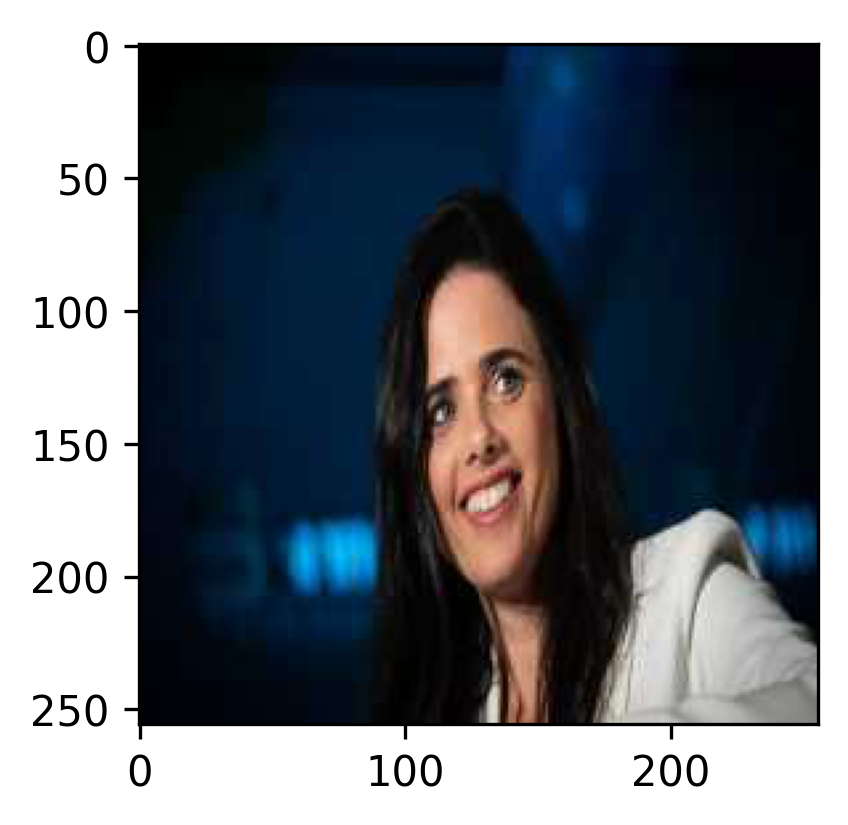

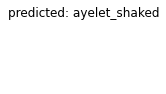

...

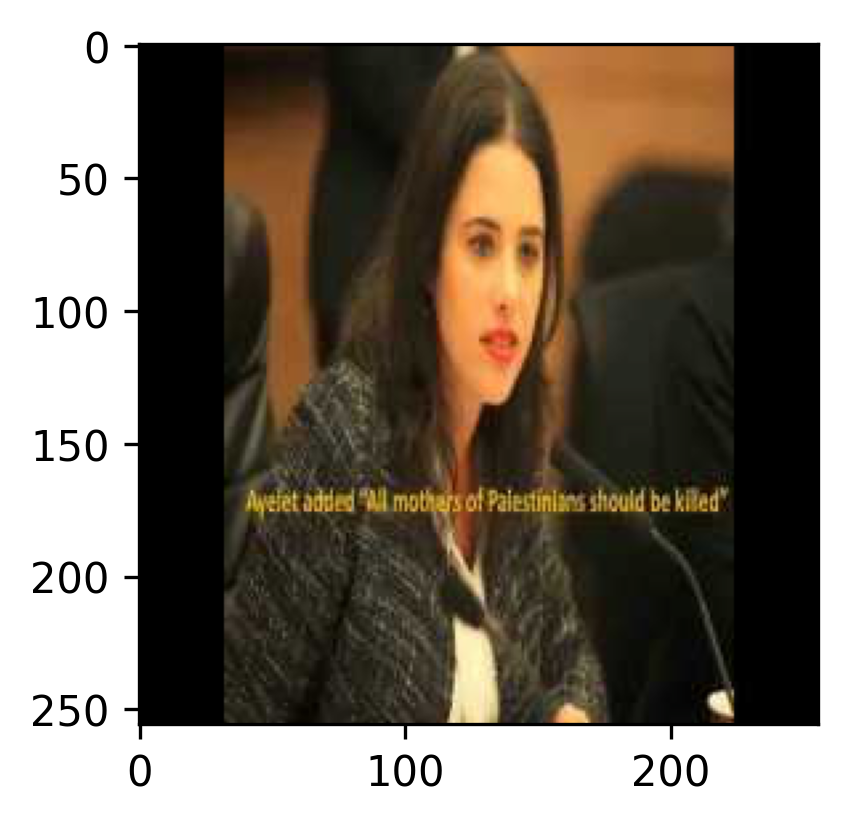

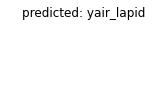

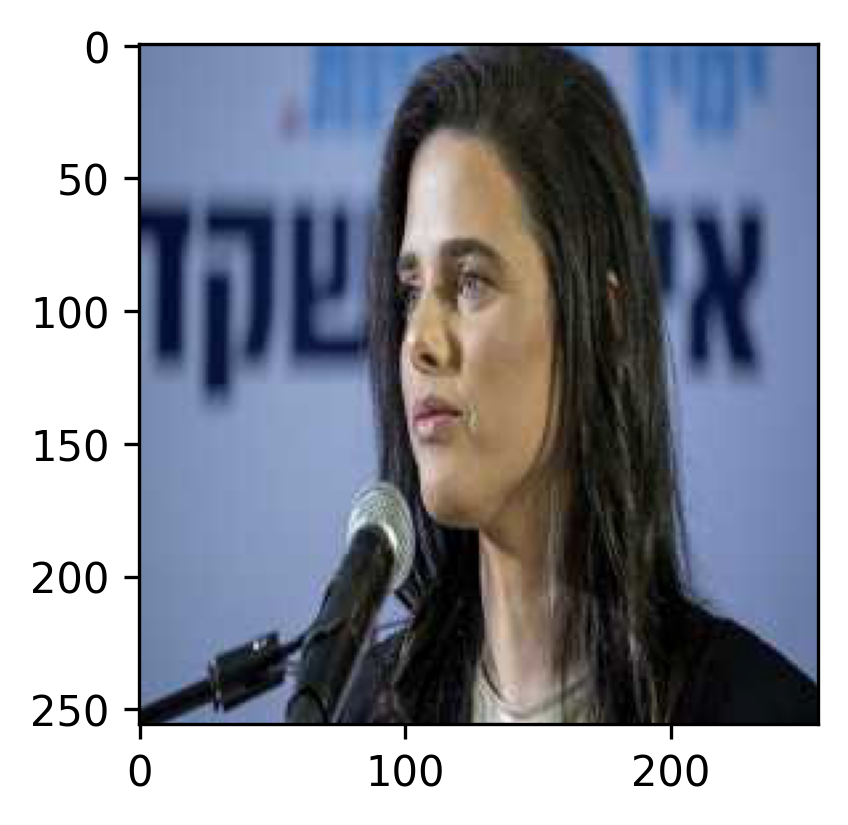

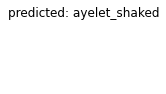

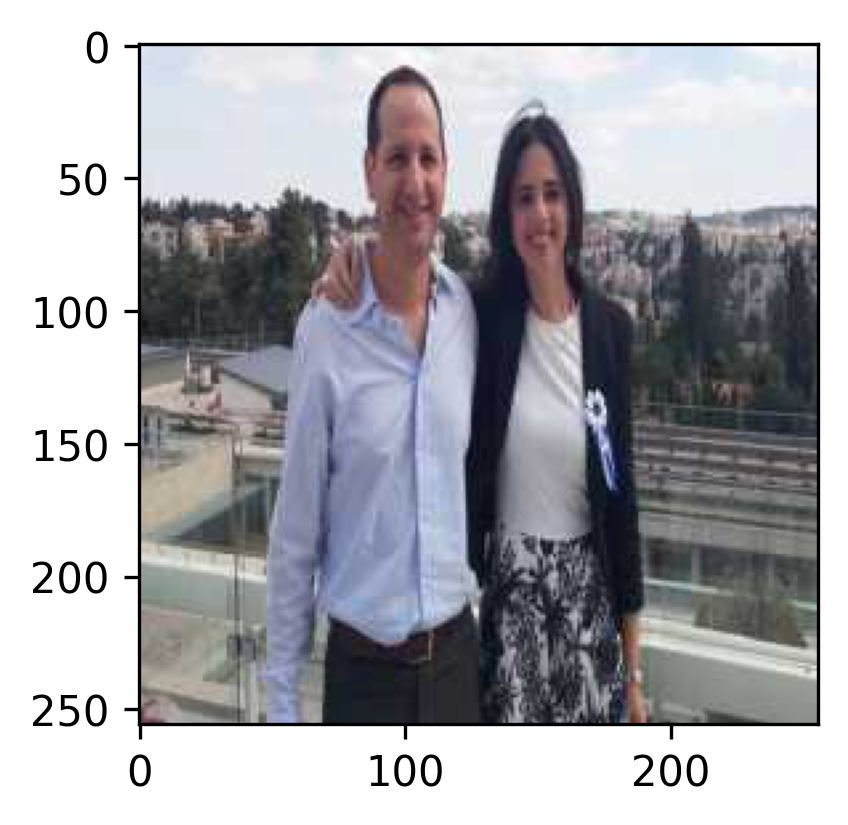

In [ ]:
visualize_model(model)

# Additional Tasks
In the sections below, you'll experiment with PyTorch and NN yourself.  

Before you start having fun on your own, let's review together how to get some predictions from our trained model.  

As we've done in both our training and visualization code, we apply the model to input with the command:  
```python
outputs = model(inputs)
```

The relevant code:

In [ ]:
inputs, labels = next(iter(dataloaders['train']))
inputs = inputs.to(device)
print(inputs)

labels = labels.to(device)
print(labels)

tensor([[[[-1.0048, -1.3473, -0.9192,  ...,  1.2899,  0.7419, -0.2513],
          [-1.1247, -1.4500, -0.9705,  ...,  1.2899,  0.7419, -0.2513],
          [-1.2445, -1.5357, -1.0390,  ...,  1.2899,  0.7419, -0.2513],
          ...,
          [ 1.2043, -0.3712, -1.3987,  ..., -1.2103, -0.7993, -0.2342],
          [ 1.2385, -0.3712, -1.3815,  ..., -1.1075, -0.9363, -0.7479],
          [ 1.2899, -0.2856, -1.3130,  ..., -1.0733, -1.0219, -1.0390]],

         [[-0.8277, -1.1779, -0.7402,  ...,  1.4657,  0.9055, -0.1099],
          [-0.9503, -1.2829, -0.7927,  ...,  1.4657,  0.9055, -0.1099],
          [-1.0728, -1.3704, -0.8627,  ...,  1.4657,  0.9055, -0.1099],
          ...,
          [ 1.2381, -0.4076, -1.4755,  ..., -0.3901, -0.1099,  0.3803],
          [ 1.3782, -0.2675, -1.3354,  ..., -0.2675, -0.2325, -0.1275],
          [ 1.4832, -0.1450, -1.2304,  ..., -0.1800, -0.2850, -0.4076]],

         [[-0.6193, -0.9678, -0.5321,  ...,  1.7163,  1.1585,  0.1476],
          [-0.7413, -1.0724, -

Note that we got tensors. We can convert them into numpy objects. Since we've previously set them to use GPU, We'll need to set them to use CPU first:

In [ ]:
labels.cpu().numpy()

array([7, 8, 3, 0, 6, 1, 4, 1, 1, 6, 4, 6, 4, 1, 7, 3])

In [ ]:
outputs = model(inputs)

print(outputs.shape)
print(outputs)

torch.Size([16, 9])
tensor([[-3.2192e+00, -8.2875e+00, -7.5727e+00,  8.5861e-01,  2.5444e+00,
         -9.3801e-01, -6.1565e+00,  2.2912e+01, -8.8607e-01],
        [-3.4605e-01, -9.0828e-01,  1.8543e+00, -2.9141e+00,  1.7754e-01,
         -3.3981e+00, -3.7202e+00, -3.6283e-01,  9.4487e+00],
        [-9.3711e-01, -4.1603e+00, -8.5741e+00,  1.4611e+01, -1.0009e+00,
         -3.1518e+00,  2.2999e+00,  1.4899e+00, -1.7471e+00],
        [ 7.9169e+00, -3.7686e+00, -4.1823e+00, -1.8893e-02, -1.6522e+00,
         -1.2897e+00,  9.5786e-01,  1.2293e+00, -8.6915e-01],
        [ 1.2050e+00, -2.8089e-01,  1.3033e+00, -3.1550e-01, -1.4975e+00,
         -2.5294e+00,  1.1609e+01, -5.6563e+00, -4.0667e+00],
        [-7.5254e+00,  1.4525e+01, -1.1266e+00,  1.3721e-01,  2.8980e+00,
         -4.5259e+00,  2.6584e+00, -5.7147e+00, -1.4934e+00],
        [-5.9652e+00, -2.0999e+00, -1.2646e+00,  1.7416e+00,  1.6461e+01,
         -3.7033e+00, -1.7696e+00,  1.2695e+00, -4.8349e+00],
        [-8.9547e+00,  1.732

Note that `outputs` have 16 "rows", one for each of the images in our batch, and each "row" has 9 values, for each of our classes.  
The values are the activations of the neurons, before applying the softmax function to them. To apply the softmax function to them, we can run:

In [ ]:
torch.nn.functional.softmax(outputs, dim=1).cpu().detach().numpy()

array([[4.48234548e-12, 2.82066461e-14, 5.76494283e-14, 2.64528538e-10,
        1.42759149e-09, 4.38741751e-11, 2.37610441e-13, 1.00000000e+00,
        4.62133491e-11],
       [5.57001913e-05, 3.17457016e-05, 5.02856507e-04, 4.27135956e-06,
        9.40264872e-05, 2.63241964e-06, 1.90763240e-06, 5.47733434e-05,
        9.99252141e-01],
       [1.76747577e-07, 7.03918390e-09, 8.52403495e-11, 9.99993086e-01,
        1.65830400e-07, 1.92987990e-08, 4.49975141e-06, 2.00170598e-06,
        7.86243248e-08],
       [9.97117400e-01, 8.39036056e-06, 5.54776852e-06, 3.56663455e-04,
        6.96521674e-05, 1.00081372e-04, 9.47237830e-04, 1.24264543e-03,
        1.52403547e-04],
       [3.03137294e-05, 6.85975192e-06, 3.34418255e-05, 6.62636694e-06,
        2.03212926e-06, 7.24075846e-07, 9.99919772e-01, 3.17542330e-08,
        1.55643534e-07],
       [2.65110489e-10, 9.99983191e-01, 1.59358763e-07, 5.63981018e-07,
        8.91814943e-06, 5.32229816e-09, 7.01775616e-06, 1.62105573e-09,
        1.1

## Task 1: Plot model convergence
Adapt the code above to plot the loss and the accuracy every epoch. Show both the training and the validation performance.  
Does our model overfit?  
Do you have suggestions following these graphs? 

we implemented couple helpers and abstract model class, that plot learning curves on each epoch, it's easier to check training process (we didn't learn tensorboard yet)

## Helper functions

In [ ]:
import pandas as pd
import gc
from IPython.display import clear_output
import PIL
from torch import nn

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn')
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}

def clear_cache():
  gc.collect()
  if torch.cuda.is_available():
    torch.cuda.empty_cache()

def setup_seed(rnd_state=42):
  import torch
  import random
  random.seed(rnd_state)
  np.random.seed(rnd_state)
  torch.manual_seed(rnd_state)
  if torch.cuda.is_available():
      torch.cuda.manual_seed_all(rnd_state)

setup_seed()
torch.backends.cudnn.benchmark = True

In [ ]:
class AbstractModel(nn.Module):
  def __init__(self, cls2idx, pretrained=True, feature_extracting=False,  *args, **kwargs):
    super(AbstractModel, self).__init__()
    self.metric_history = {"train":[], "val":[]} 
    self.cls2idx = cls2idx
    self.num_classes= len(cls2idx)
    self.idx2cls = {v:k for k,v in self.cls2idx.items()}
    self.pretrained = pretrained
    self.feature_extracting=feature_extracting
    

  @torch.no_grad()
  def predict_image(self, img, return_class=False):
    self.eval()
    if isinstance(img, str):
      img = PIL.Image.open(img)
    if not torch.is_tensor(img):
      img = data_transforms["val"](img)
    img = img.unsqueeze(0).to(device)
    outputs = self(img) 
    if return_class:
      _, preds = torch.max(outputs, 1) 
      return self.idx2cls[preds.item()]
    else:
      return outputs

  def __freeze_pretrained__(self):
    for layer in list(self.children()):
      for param in layer.parameters():
        param.requires_grad = False
  
  def init_weights(self, modules=None):
    if not hasattr(self, "detector") or self.detector is None: return
    if self.pretrained: return
    modules = self.detector.modules() if modules is None else modules
    for m in modules:
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight.data)
            # nn.init.kaiming_normal_(m.weight.data, mode='fan_out')
            if m.bias is not None:
                m.bias.data.zero_()
        elif isinstance(m, nn.BatchNorm2d):
            m.weight.data.fill_(1)
            m.bias.data.zero_()
        elif isinstance(m, nn.Linear):
            m.weight.data.normal_(0, 0.01)
            m.bias.data.zero_()

  
  @torch.no_grad()
  def predict(self, test_dataloaders):
    self.eval()
    clear_cache()
    ret = np.zeros((len(test_dataloaders), 1))
    for idx, inputs in enumerate(test_dataloaders):
        if isinstance(inputs, list):
          inputs = inputs[0]
        inputs = inputs.to(device)
        outputs = self(inputs) 
        _, preds = torch.max(outputs, 1) 
        ret[idx] = preds.item()
    return ret
 
  def fit(self, dataloaders, criterion, optimizer, scheduler, num_epochs=25, do_plot=True):
    self.metric_history = {"train":[], "val":[]} 
    model = self
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    for epoch in range(num_epochs):
        clear_cache()
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  
            else:
                model.eval()   
            running_loss = 0.0
            running_corrects = 0
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase=='train'):
                    outputs = model(inputs) 
                    _, preds = torch.max(outputs, 1) 
                    loss = criterion(outputs, labels)
                    if phase == 'train':
                        loss.backward() 
                        optimizer.step()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            if phase == 'train':
                if isinstance(scheduler, lr_scheduler.ReduceLROnPlateau):
                  scheduler.step(epoch_loss)
                else:
                  scheduler.step()  
            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            self.metric_history[phase].append({"epoch": epoch,"loss":epoch_loss, "acc":epoch_acc.item()})
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        print()
        if do_plot:
          self.plot_learning_curves(title='Epoch {}/{}'.format(epoch, num_epochs - 1))
        
    time_elapsed = time.time() - since
    print(f'Training complete in {(time_elapsed // 60):.0f}m {(time_elapsed % 60):.0f}s')
    print(f'Best val Acc: {best_acc:4f}')
    model.load_state_dict(best_model_wts)
    if do_plot:
      self.plot_learning_curves()
    return self.metric_history

  def forward(self, in_data):
    x = self.detector(in_data)
    return x

  def summary(self):
    return summary(self, (3, 256, 256))

  def plot_learning_curves(self, do_clear=True, title=""):
    if do_clear:
      clear_output(wait=True)
    with plt.style.context('seaborn-whitegrid'):
      fig,ax = plt.subplots(1,2, figsize=(16, 6))
      train_history = pd.DataFrame(self.metric_history["train"])
      val_history = pd.DataFrame(self.metric_history["val"])
      train_history.plot(x="epoch", y="acc", ax=ax[0], color="r", label="acc_train") 
      val_history.plot(x="epoch", y="acc", ax=ax[0], color="b", label="acc_val")
      train_history.plot(x="epoch", y="loss", color="r", ax=ax[1], label="loss_train")
      val_history.plot(x="epoch", y="loss", color="b", ax=ax[1], label="loss_val")
      ax[0].set_title(f'Train Acc: {train_history.iloc[-1]["acc"]:.4f} Val Acc: {val_history.iloc[-1]["acc"]:.4f}')
      ax[1].set_title(f'Train Loss: {train_history.iloc[-1]["loss"]:.4f} Val Loss: {val_history.iloc[-1]["loss"]:.4f}')
      if not title:
        fig.suptitle(title)
      plt.show();

In [ ]:
class BaselineVGG16(AbstractModel):
  def __init__(self, cls2idx, pretrained=True, feature_extracting=False, *args, **kwargs):
    super(BaselineVGG16, self).__init__(cls2idx, pretrained=pretrained, feature_extracting=feature_extracting, *args, **kwargs)
    self.detector = models.vgg16(pretrained=self.pretrained)
    last_layer = list(self.detector.children())[-1]
    if hasattr(last_layer, 'in_features'):
        num_ftrs = last_layer.in_features
    else:
        num_ftrs = last_layer[-1].in_features
    if self.feature_extracting:
      self.__freeze_pretrained__()
    # we change classifier after freezing, hence last layer should be trainable, it happens in abstract class
    self.detector.classifier[6] = nn.Linear(in_features=num_ftrs, out_features=self.num_classes)

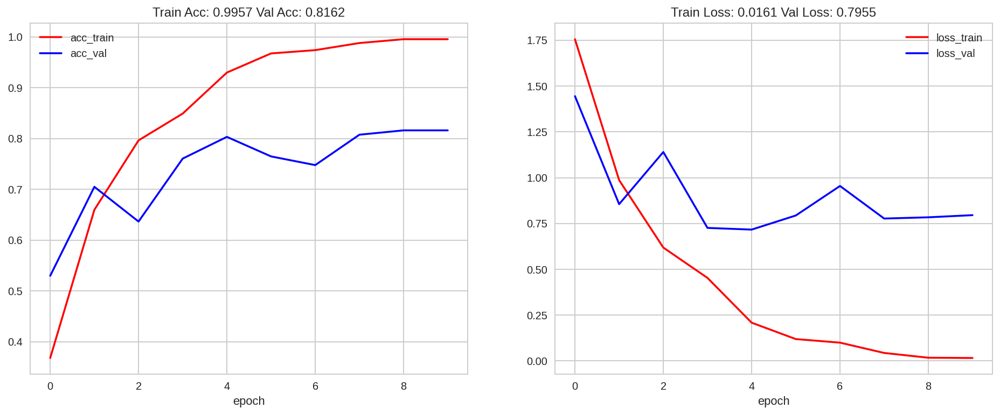

In [ ]:
cls2idx = train_dataloader.dataset.class_to_idx
model = BaselineVGG16(cls2idx=cls2idx, pretrained=True, feature_extracting=False).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

As we see, after 4 epoch our model is overfitted, validation loss is flat while training loss continues to decrease (same with on accuracy comparisons).

What could we do? first of all try check what will happen if we try to handle the problem of the imbalanced classes

In [ ]:
import glob2 as glob
from pathlib import Path
import seaborn as sns

samples=[]
for f in ["./data/israeli_politicians/train", "./data/israeli_politicians/val"]:
  for img in glob.glob(f+"/**/*.jpg", recursive=True):
    label = os.path.basename(Path(img).parent)
    samples.append({"filename":img, "label":label, "phase": os.path.basename(f)})
samples = pd.DataFrame(samples)

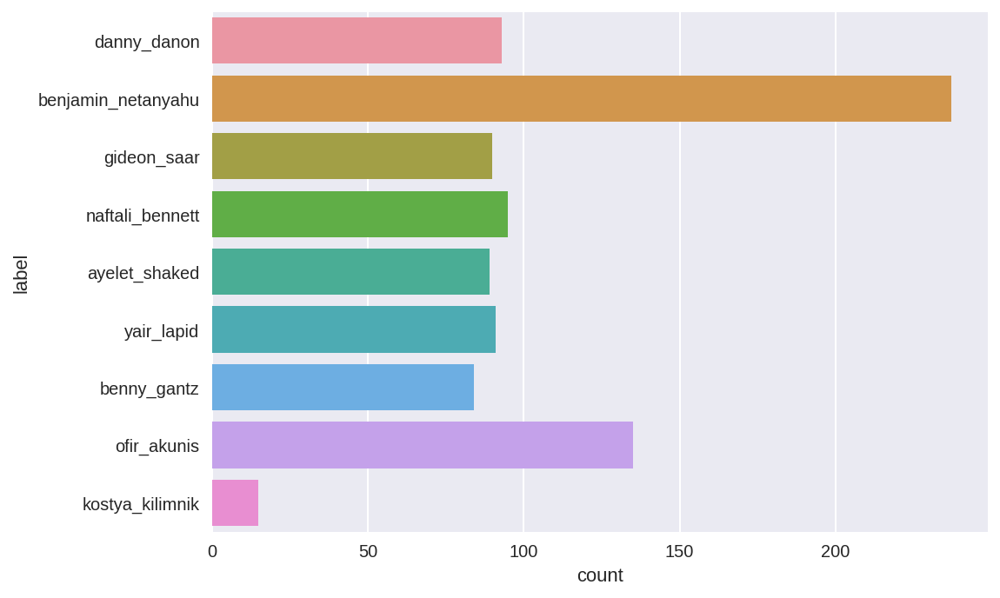

In [ ]:
sns.countplot(y=samples[samples["phase"]=="train"]["label"])

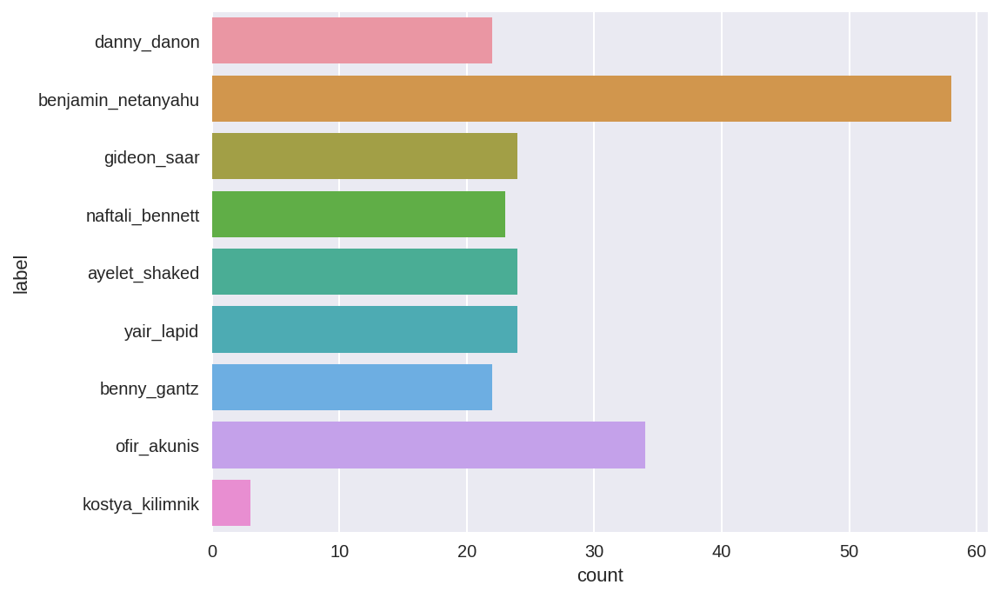

In [ ]:
sns.countplot(y=samples[samples["phase"]=="val"]["label"])

let's try to sample according weights of the samples per classes

In [ ]:
from torch.utils.data import WeightedRandomSampler

def check_weights_experiment():
    """
    we do not want change global vars, let's compute it separately
    """
    def get_weights_to_fix(data, num_classes=9):
        amounts = [0] * num_classes
        for _, lable in data:
            amounts[lable] += 1
        tot_samples = sum(amounts)
        ratios = [tot_samples / amounts[i] for i in range(num_classes)]
        weights = [ratios[j] for _, j in data]
        return weights

    data_dir = r'./data/israeli_politicians/'

    image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                              data_transforms[x])
                      for x in ['train', 'val']}

    weights = get_weights_to_fix(image_datasets['train'])
    train_sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights))

    dataloaders = {
        'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                            num_workers=4, sampler=train_sampler),
        'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                              shuffle=False, num_workers=4)
      }
    dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
    print('dataset_sizes: ', dataset_sizes)

    class_names = image_datasets['train'].classes
    print('class_names:', class_names)
    train_dataloader = dataloaders['train']

    model = BaselineVGG16(cls2idx=cls2idx).to(device)
    optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
    criterion = nn.CrossEntropyLoss()
    num_epochs = 10
    history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)
    return model, history

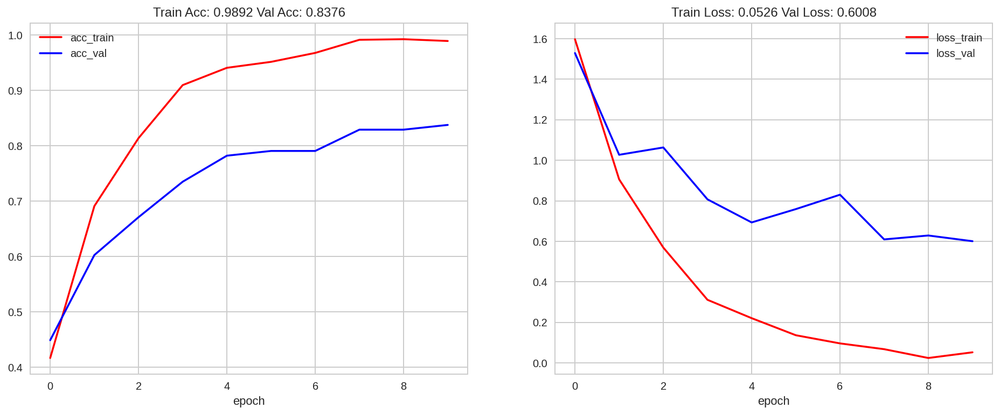

In [ ]:
check_weights_experiment();

It doesn't seem to improve the results by much, and it's reasonable as we use weight sampler on training set but, not on validation set. After looking at the images themselves, we found out we have not just small amount of the data, but also different distributions / nature of the pictures train vs val sets, - multiple faces per class, like common photos - Bibi with Gantz, where model could not infer what is difference between them and on small val data, and cost of error per sample on validation is too high.

besides lr scheduler, which reduces the learning rate over times, there is another way that we can reduce the learning rate by some factors (say 10) if the validation loss stops improving in some epochs (say 5) and stop the training process if the validation loss stops improving in some epochs (say 10). this can be done easily by using ReduceLROnPlateau

In [ ]:
def check_reduceplateu_sheduler_experiment():
    model = BaselineVGG16(cls2idx=cls2idx).to(device)
    optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    # we tried also this one:
    # exp_lr_scheduler = lr_scheduler.CosineAnnealingLR(optimizer_ft, T_max=20)
    exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer_ft)
    criterion = nn.CrossEntropyLoss()
    num_epochs = 10
    history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)
    return model, history

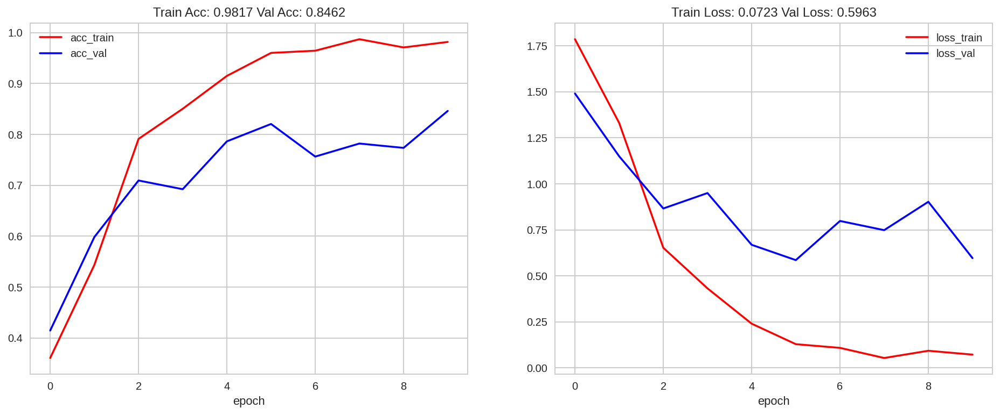

In [ ]:
check_reduceplateu_sheduler_experiment();

Model using changes of LR doesn't significantly improve the results, but we see instability in training and learning curves. It seems that we already have limitation of the architecture on this small data. We should mention that VGG16 doesn't have batch normalizations, so we also could try use just small batch_size like = 1. Another technics of the avoiding small data problem is augmentation like horisontals flipping, small rotations - some changes that could not impact on face recognition in a bad way (we will use it later)

### Discussion of the results

As expected for a very complex model with 134M of parameters trained on a very small dataset, the model overfits. We can easily see it by the fact that training loss is very small and training accuracy is close to 100%, while validation loss and accuracy are quite far from these results.

Our suggesions following the charts is either to provide more training examples (by getting more labeled images or applying augmentations) or try a simpler model with less parameters, that might have less overfitting and might generalize better. We could also try to use a model that was pre-trained on human faces and not on generic objects.

It also seems that training the model for much more epochs would not be helpful, as training loss is already very small and has almost stabilized.

## Task 2: Evaluate the model performance
Write code that shows the performance of our model.  
Show the classification report and the confusion matrix.  

What can you say about the model so far?  
Can you suggest a few ideas to improve it?

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

> for simplicity we will use val as test data for evaluating perfomance

In [ ]:
test_dataloaders = torch.utils.data.DataLoader(datasets.ImageFolder(os.path.join(data_dir, "val"),
                                          data_transforms["val"]), batch_size=1,
                                          shuffle=False, num_workers=4)
y_pred = model.predict(test_dataloaders)
y_true = np.array([cls.item() for _, cls in test_dataloaders])

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


In [ ]:
# let's do it in a simple way without heatmap
# sns.heatmap(confusion_matrix(y_true, y_pred))
print(confusion_matrix(y_true, y_pred))

[[22  0  0  1  0  0  0  1  0]
 [ 1 48  1  1  5  0  0  1  1]
 [ 1  6  9  0  1  0  4  0  1]
 [ 0  0  0 19  1  0  0  1  1]
 [ 0  2  0  2 20  0  0  0  0]
 [ 0  0  0  0  0  3  0  0  0]
 [ 1  2  2  0  0  1 16  1  0]
 [ 2  0  0  0  1  0  0 31  0]
 [ 0  0  0  0  0  0  0  1 23]]


In [ ]:
y_pred.shape, y_true.shape

((234, 1), (234,))

In [ ]:
y_pred = y_pred[:, 0]

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

def plot_confusion_matrix(labels, pred_labels, classes):
    fig = plt.figure(figsize = (16, 16));
    ax = fig.add_subplot(1, 1, 1);
    cm = confusion_matrix(labels, pred_labels);
    cm = ConfusionMatrixDisplay(cm, display_labels = classes);
    cm.plot(values_format = 'd', cmap = 'Blues', ax = ax)
    fig.delaxes(fig.axes[1]) #delete colorbar
    plt.xticks(rotation = 90)
    plt.xlabel('Predicted Label', fontsize = 50)
    plt.ylabel('True Label', fontsize = 50)

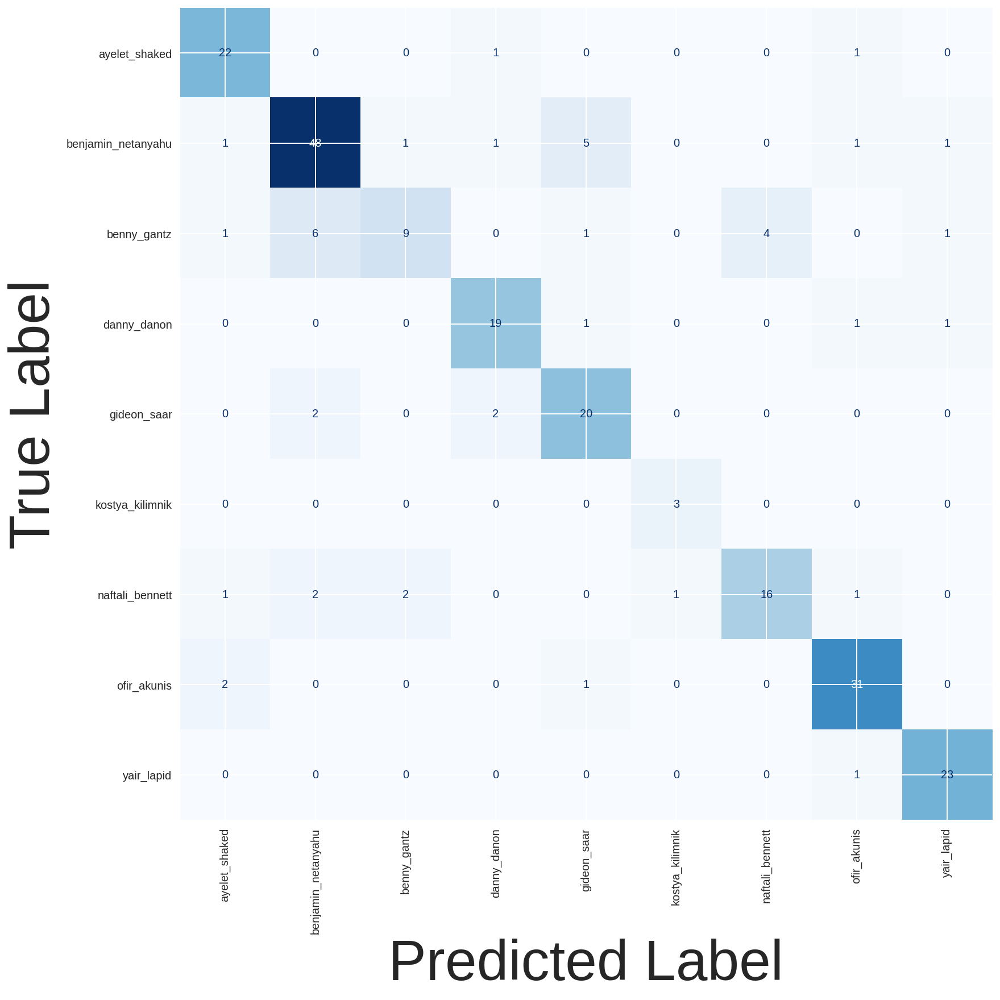

In [ ]:
plot_confusion_matrix(y_true, y_pred, list(cls2idx.keys()))

In [ ]:
print(classification_report(y_true, y_pred, target_names=list(cls2idx.keys())))

                    precision    recall  f1-score   support

     ayelet_shaked       0.81      0.92      0.86        24
benjamin_netanyahu       0.83      0.83      0.83        58
       benny_gantz       0.75      0.41      0.53        22
       danny_danon       0.83      0.86      0.84        22
       gideon_saar       0.71      0.83      0.77        24
   kostya_kilimnik       0.75      1.00      0.86         3
   naftali_bennett       0.80      0.70      0.74        23
       ofir_akunis       0.86      0.91      0.89        34
        yair_lapid       0.88      0.96      0.92        24

          accuracy                           0.82       234
         macro avg       0.80      0.82      0.80       234
      weighted avg       0.81      0.82      0.81       234



* as we see on 3 samples of kostya_kilimnik we got bad accuracy and high recall - because we have small amount of the images.
* Benny Gantz is often classified as Bibi, because they have common photos. 
* Ayelet Shaked has 100% precision, we assume it's because she has good features for distinguishing her (long hair). It makes sense also for Danny Danon (he has glasses on the train pictures) 

* what we could improve. first of all clean data:
   1. remove photos with wrong labels (e.g. there is photo with label Bibi, but it's - Jonathan Pollard )
   2. remove photos with more than 1 faces (Bibi with Gantz. what is right prediction of it?)
   3. remove low resolution photos and raw quality photo
   4. try to crop faces as part of the preprocessing 

## Task 3: Perform Error Analysis 
Error Analysis is an extremely important practice in Machine Learning research. It is rare that our base model works great out of the box. Proper error analysis helps us detect and fix issues in our DL code, data preprocessing and even in the data itself.

In [ ]:
from torch.nn import functional as F

In [ ]:
predictions_vs_labels = []
for i, row in samples[samples["phase"]=="val"].iterrows():
   outputs = F.softmax(model.predict_image(row["filename"]), dim=1)
   proba, preds = torch.max(outputs, 1) 
   predicted =  model.idx2cls[preds.item()]
   proba = proba.item()
   predictions_vs_labels.append({"label":row["label"], "proba":proba, "predicted":predicted, "filename":row["filename"]})

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


In [ ]:
predictions_vs_labels = pd.DataFrame(predictions_vs_labels)

In [ ]:
incorrect_predictions = predictions_vs_labels[predictions_vs_labels["label"]!=predictions_vs_labels["predicted"]]
incorrect_predictions.sample(5)

,label,proba,predicted,filename
189,benny_gantz,0.457663,ayelet_shaked,./data/israeli_politicians/val/benny_gantz/ima...
134,ayelet_shaked,0.972680,danny_danon,./data/israeli_politicians/val/ayelet_shaked/i...
139,ayelet_shaked,0.688407,ofir_akunis,./data/israeli_politicians/val/ayelet_shaked/i...
188,benny_gantz,0.971882,benjamin_netanyahu,./data/israeli_politicians/val/benny_gantz/ima...
184,benny_gantz,0.555895,naftali_bennett,./data/israeli_politicians/val/benny_gantz/ima...


In [ ]:
import PIL

In [ ]:
def plot_most_incorrect(incorrect, classes, n_images, for_class=""):
    if for_class:
      incorrect = incorrect[:][incorrect["label"]==for_class].reset_index()

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))
    fig = plt.figure(figsize = (25, 20))
    for i in range(rows*cols):
        if len(incorrect)<=i: break
        ax = fig.add_subplot(rows, cols, i+1)
        
        row = incorrect.iloc[i]
        filename, true_class, incorrect_class, incorrect_prob = row["filename"], row["label"], row["predicted"], row["proba"]
        image = data_transforms["val"](PIL.Image.open(filename))
        filename = os.path.basename(filename)
        true_prob = 0.0

        inp = image.numpy().transpose((1, 2, 0))
        mean = np.array(means)
        std = np.array(stds)
        inp = std * inp + mean
        inp = np.clip(inp, 0, 1)
        
        ax.imshow(inp)
        ax.set_title(f'{filename}\n' \
                     f'true label: {true_class} \n' \
                     f'pred label: {incorrect_class} ({incorrect_prob:.3f})')
        ax.axis('off');
        
    fig.subplots_adjust(hspace=0.4);

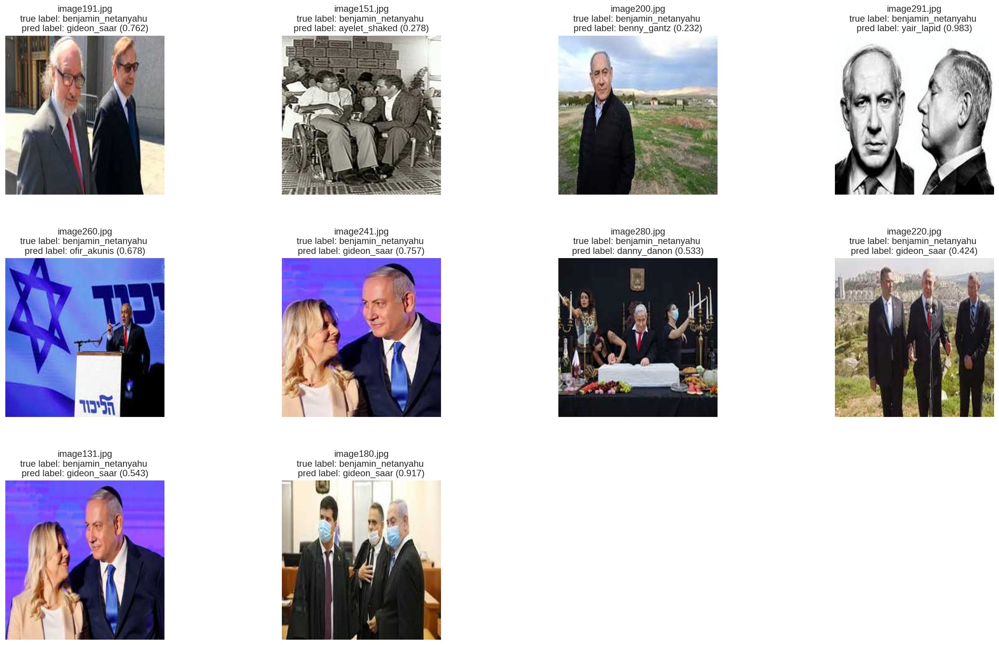

In [ ]:
plot_most_incorrect(incorrect_predictions, list(cls2idx.keys()), n_images=20, for_class="benjamin_netanyahu")

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


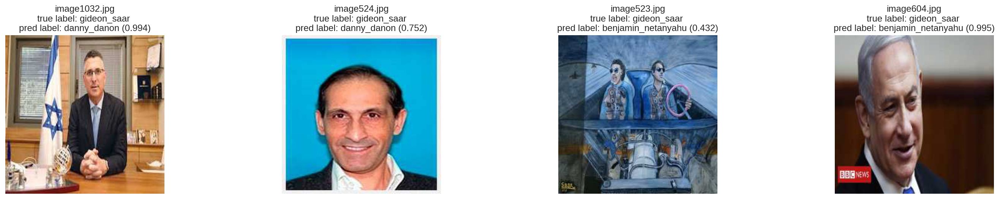

In [ ]:
plot_most_incorrect(incorrect_predictions, list(cls2idx.keys()), n_images=20, for_class="gideon_saar")

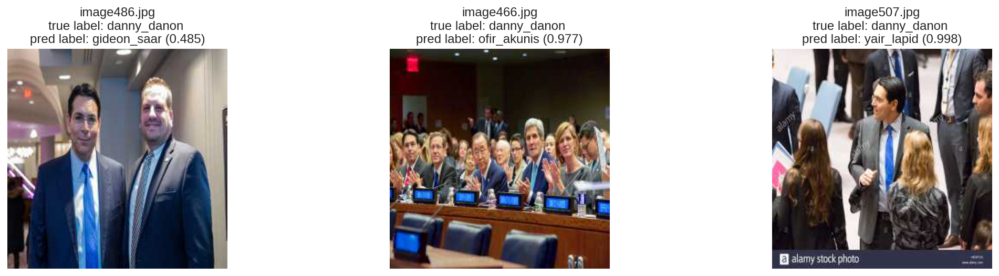

In [ ]:
plot_most_incorrect(incorrect_predictions, list(cls2idx.keys()), n_images=20, for_class="danny_danon")

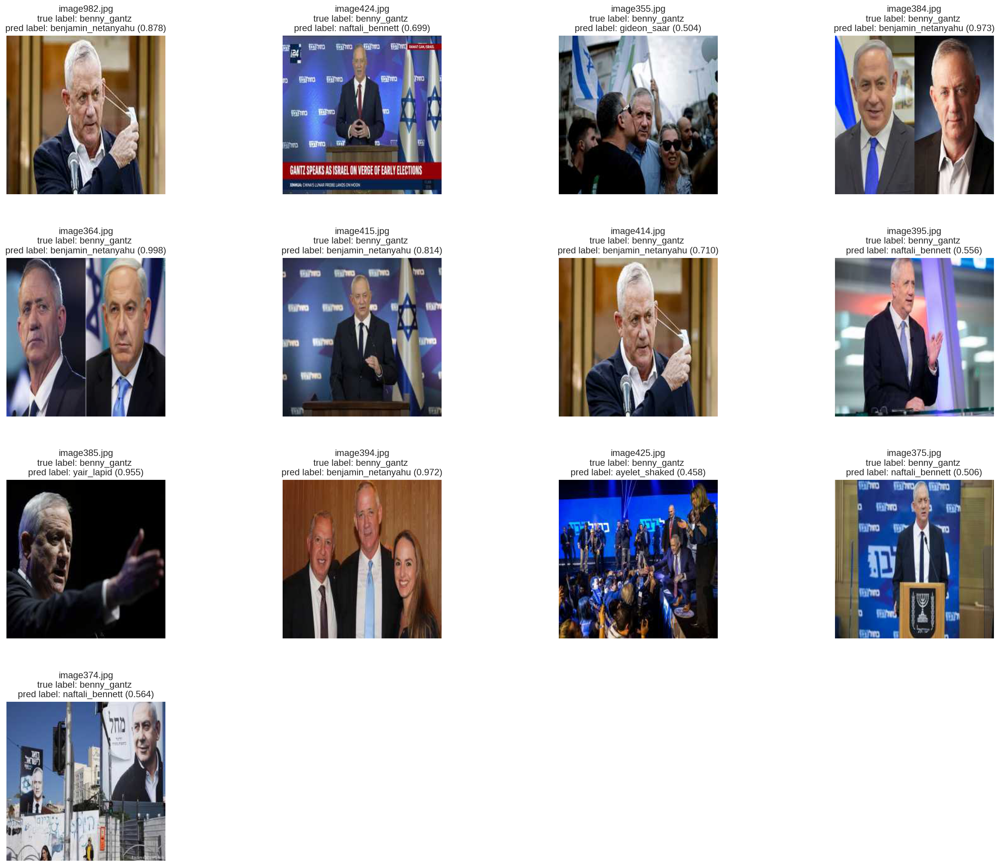

In [ ]:
plot_most_incorrect(incorrect_predictions, list(cls2idx.keys()), n_images=20, for_class="benny_gantz")

we found incorrect label - image191.jpg - it's not Bibi

let's check common photo of Bibi and Gantz together (predicted: Bibi , label:Gantz) and visualize the activation of the last feature layer

In [ ]:
%%capture

!pip install pytorch-gradcam

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


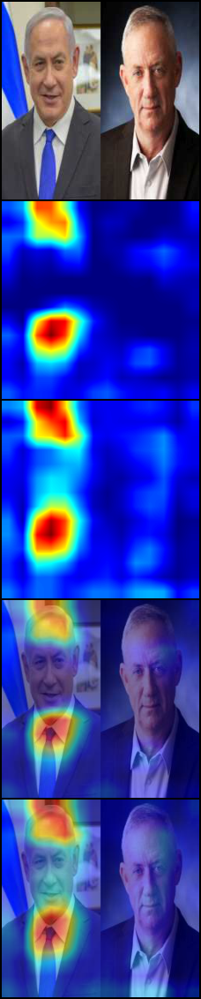

In [ ]:
from gradcam.utils import visualize_cam
from gradcam import GradCAM, GradCAMpp
layer_name='features_29' # last CNN layer

img_path = "./data/israeli_politicians/val/benny_gantz/image384.jpg"
pil_img = PIL.Image.open(img_path)

torch_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])(pil_img).to(device)
normed_torch_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(torch_img)[None].to(device)

vgg = model.detector.to(device)
configs = [dict(model_type='vgg', arch=vgg, layer_name='features_29')]
cams = [
    [cls.from_config(**config) for cls in (GradCAM, GradCAMpp)]
    for config in configs
]
images = []
for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, torch_img)
    
    images.extend([torch_img.cpu(), heatmap, heatmap_pp, result, result_pp])
    
grid_image = torchvision.utils.make_grid(images, nrow=1)

transforms.ToPILImage()(grid_image)

as we can see, our model concentrates mostly on Bibi features, that's why it's predicted as Bibi. 

#### Review examples of top errors
One of the basic techniques of Error Analysis is manually reviewing the top errors of the model - samples where the model was most confident about one class, but the true label was different.  
Plot the top 10 errors of the model for each true class.  
Do you spot any issue or pattern?  
Try to see if you can improve the performance of the model following your insights.

*  as we see, our model indeed make wrong predictions sometimes because of common photo, we see that attention of our model on Bibi instead of Gantz. One of the solution is using detector, like - https://github.com/timesler/facenet-pytorch.
*  also make sense check acc@top_k
*  we tried to remove photos with several faces and it slightly improved the model accuracy

## Task 4: NN as a fixed feature extractor

Here, we need to freeze all the network except the final layer. We need
to set ``requires_grad == False`` to freeze the parameters so that the
gradients are not computed in ``backward()``.

You can read more about this in the documentation [here](https://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward).




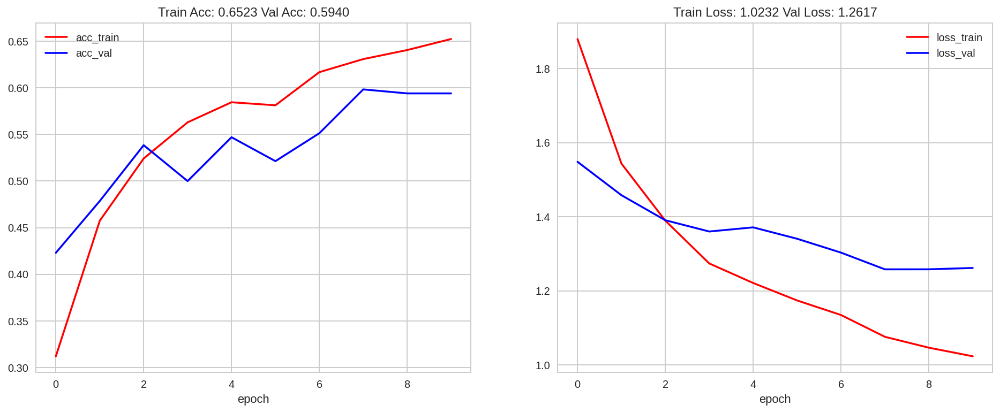

In [ ]:
model = BaselineVGG16(cls2idx=cls2idx, feature_extracting=True).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

let's check how many trainable params we had for to be sure, that it was indeed feature extractions model where everything except last one layer is freezing up

In [ ]:
model.summary()

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
              ReLU-2         [-1, 64, 256, 256]               0
            Conv2d-3         [-1, 64, 256, 256]          36,928
              ReLU-4         [-1, 64, 256, 256]               0
         MaxPool2d-5         [-1, 64, 128, 128]               0
            Conv2d-6        [-1, 128, 128, 128]          73,856
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]         147,584
              ReLU-9        [-1, 128, 128, 128]               0
        MaxPool2d-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]         295,168
             ReLU-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
             ReLU-14          [-1, 256,

as we see indeed Trainable params: 36,873 and Linear-39 has 36,873 params

we got worse results, but the training / valication curves are more stable, which makes sense, since we use a pre-trained model as feature extractions and train only last linear layer. This layer is not sufficiently complex or deep  to learn effectively.

also we tried catboost and embeddings from model and got similiar results

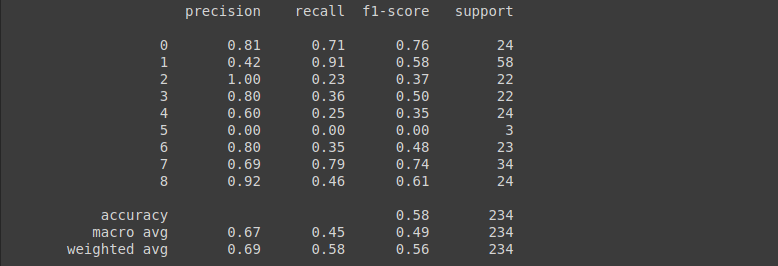

but problem here, that embeddings and features are not good enough, as we could see only Aeled Shaked has good cluster according to UMAP on embeddings

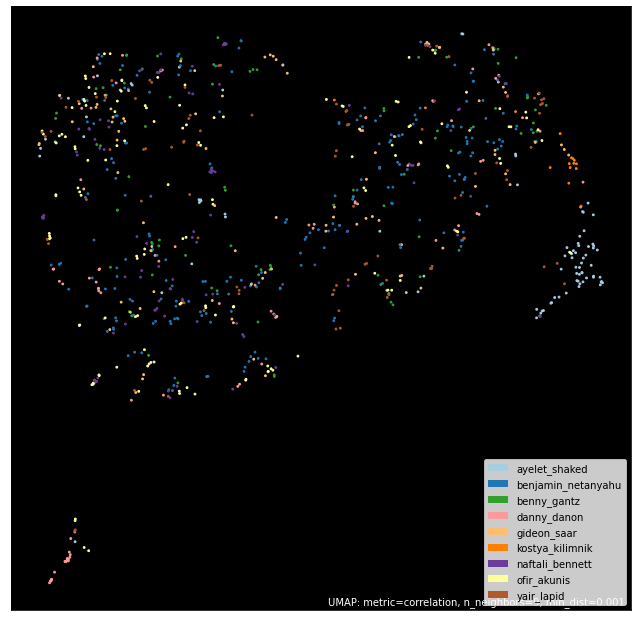

### Train and evaluate

On CPU this will take about half the time compared to previous scenario. This is expected as gradients don't need to be computed for most of the network. However, forward does need to be computed.

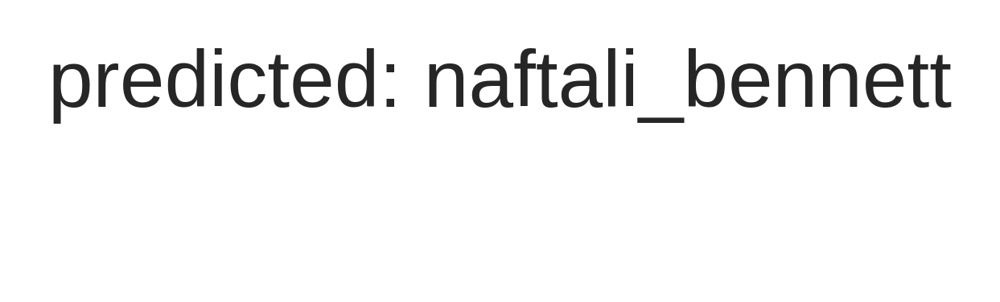

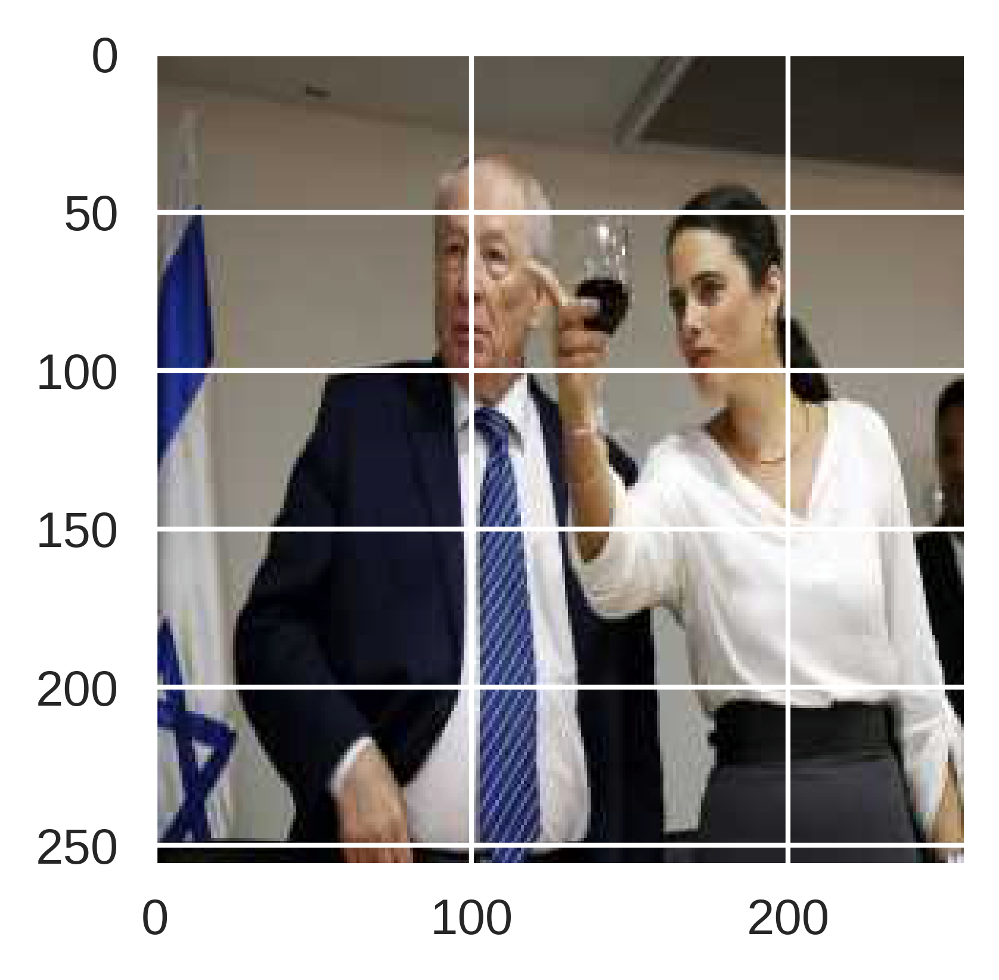

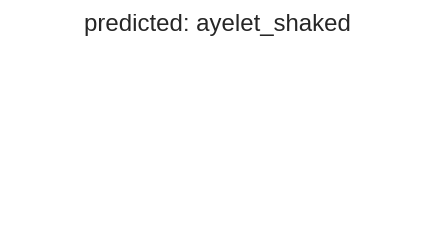

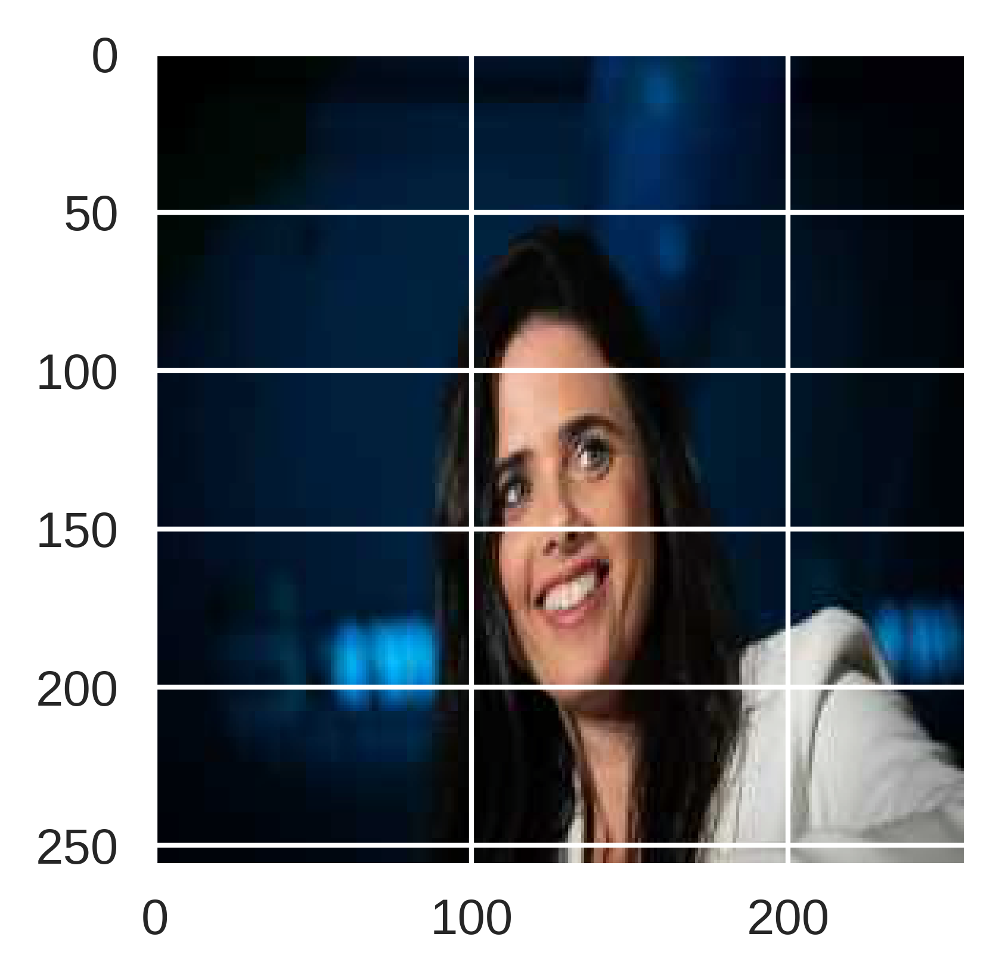

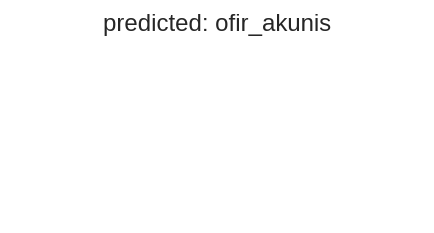

...

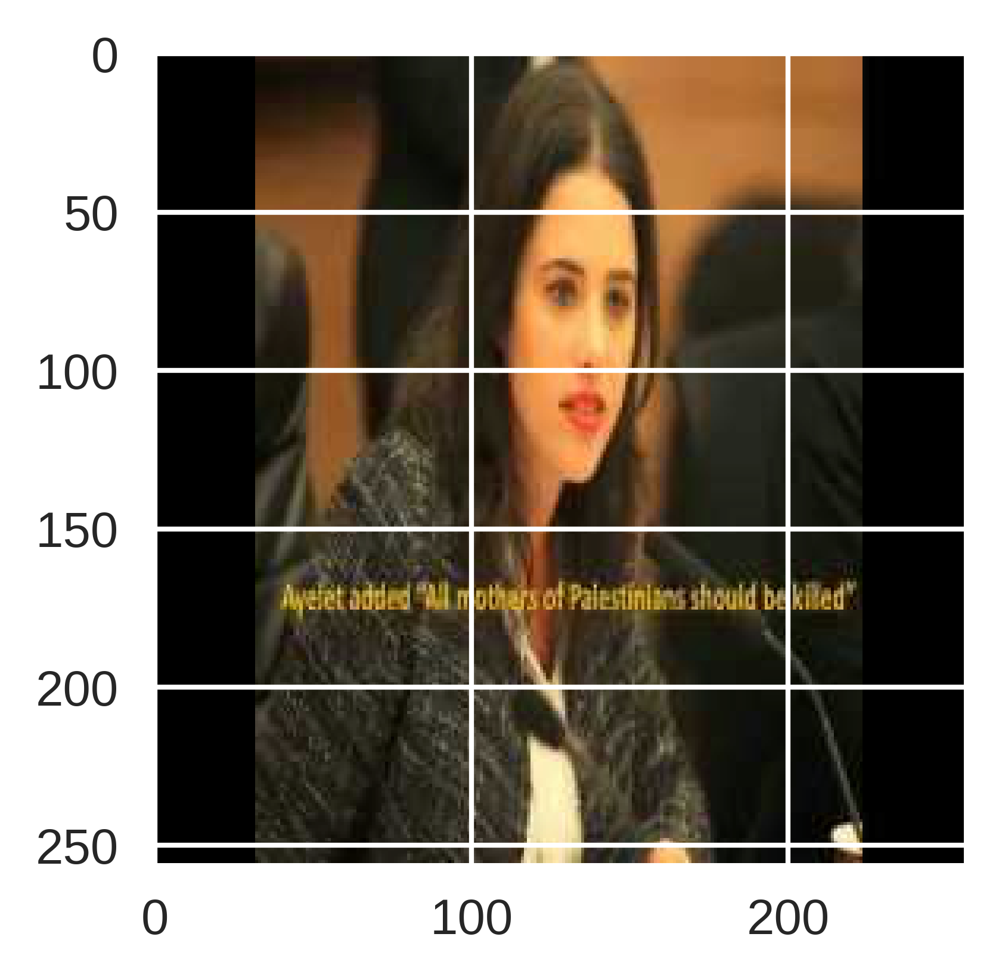

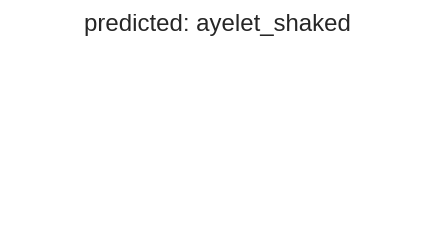

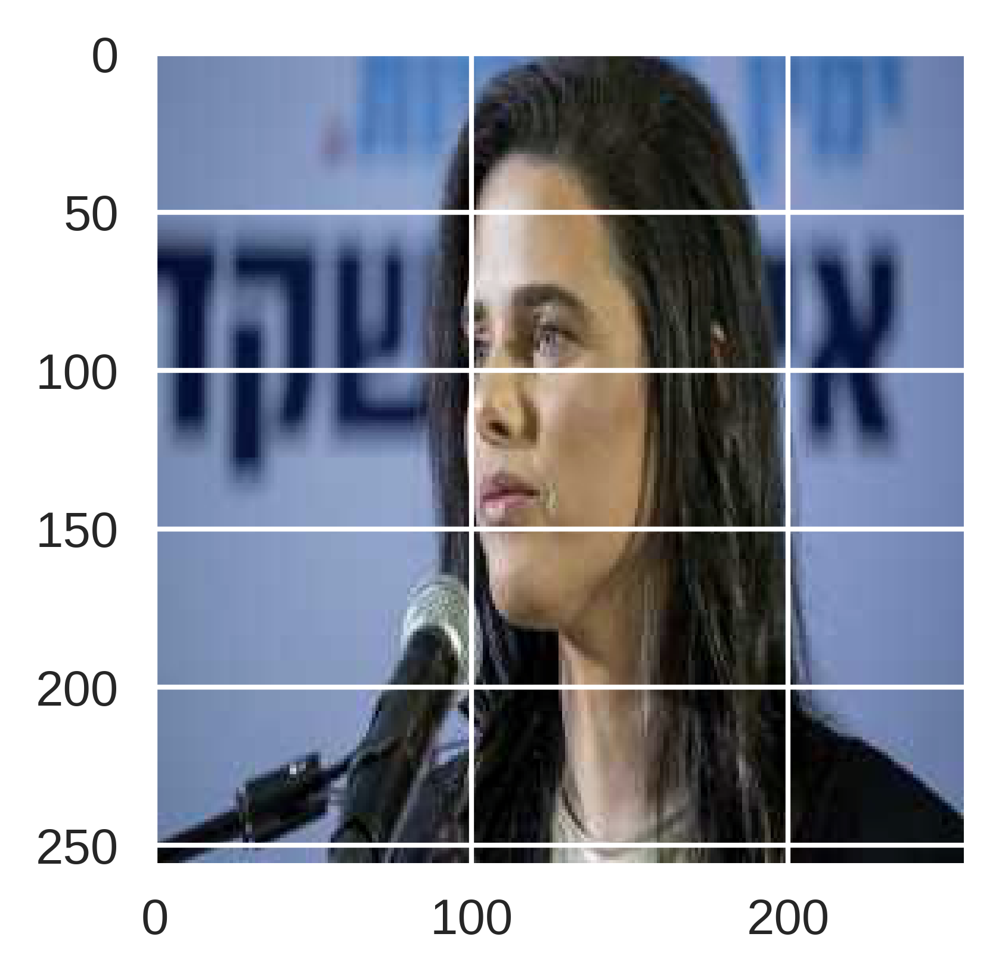

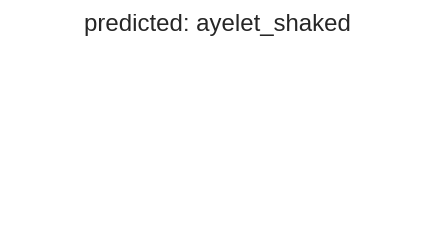

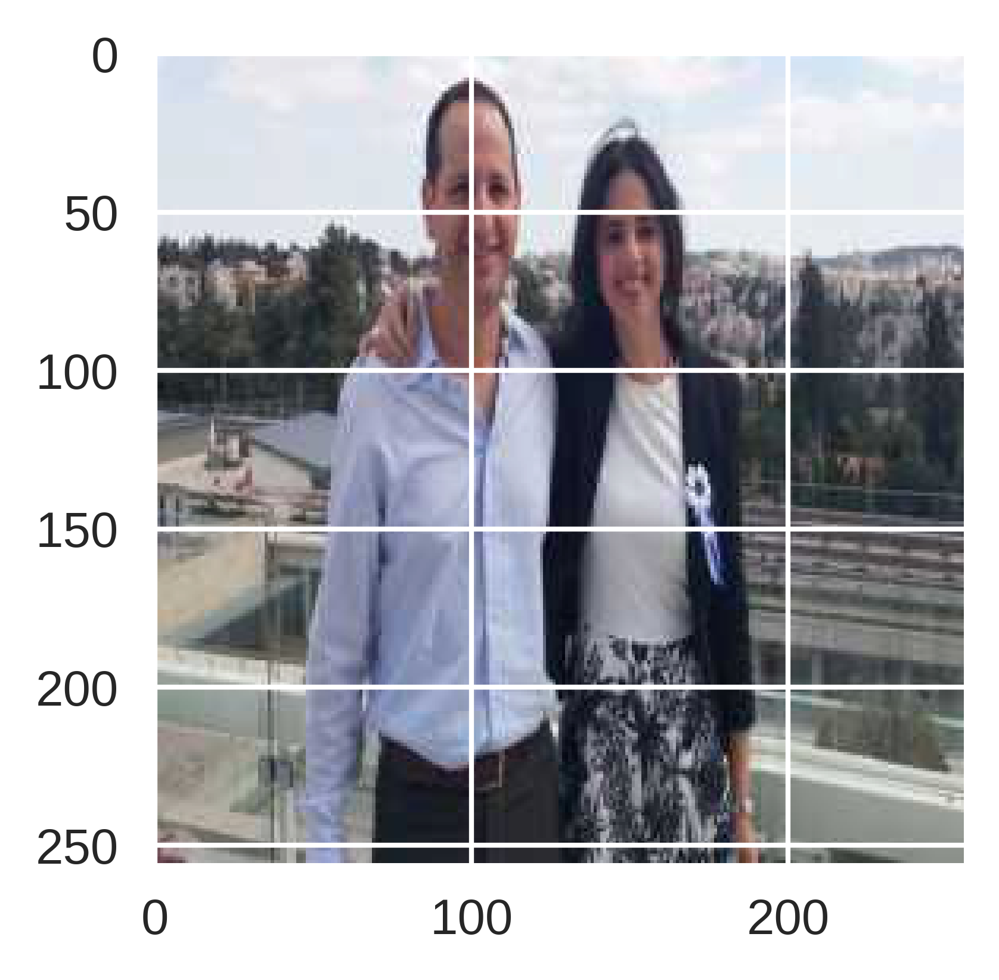

In [ ]:
visualize_model(model.detector)

plt.ioff()
plt.show()

## Task 5: Comparison with a model trained from scratch
In this section, compare the performance of the pretrained model with those of a model trained from scratch.  
Plot the train and validation loss and accuracy with time.

Note: To do this, you will need to modify `train_model()` to return the validation accuracy.

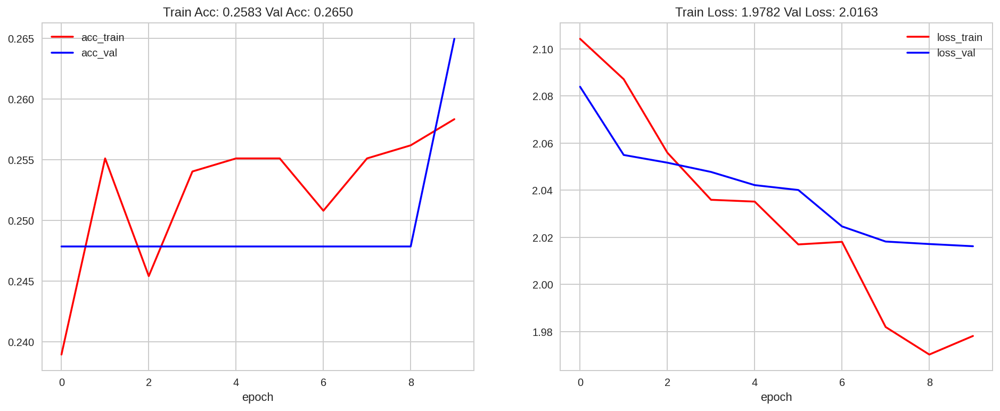

In [ ]:
model = BaselineVGG16(cls2idx=cls2idx, pretrained=False).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

### Discussion of the results

* We can see that the model starts with poor results (23-25% vs 36%-46% in pre-trained model). That is reasonable, as pre-trained weights have a lot of helpful information (that's what transfer learning is all about).
* We can see that model results after 10 training epochs are better (27%), but are still very far even from initial results of pre-trained model, let along its final results (82-83% on validation set).
* We can see that the model is not yet in over-fitted state and we should contiune to train it for large number of epochs (it is not stabilized yet and both training and validation loss are still improving).

## Task 6: Data Augmentation
Manually labeling can be expensive, both in terms of money and of time. Data augmentations serve to increase the amount of data available for the classifier without requiring labeling more images.  

The torch vision package allows easy augmentation of images using the data transforms.  
Use and adapt the code below to try different augmentations, and discuss the results and the model improvements you got from these augmentations.

[This guide](https://www.analyticsvidhya.com/blog/2019/12/image-augmentation-deep-learning-pytorch/) might help you along the way.

In [ ]:
# redefine the transform to inlcude augmentations, but only for trainset
import PIL

data_transforms_augmentations = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        torchvision.transforms.ColorJitter(hue=.05, saturation=.05),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.RandomRotation(15, resample=PIL.Image.BILINEAR),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

In [ ]:
# redefine the dataloades using the new trasnform

image_datasets_aug = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms_augmentations[x]) for x in ['train', 'val']}
dataloaders_aug = {
    'train': torch.utils.data.DataLoader(image_datasets_aug['train'], batch_size=16, shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets_aug['val'], batch_size=16, shuffle=False, num_workers=4)
  }

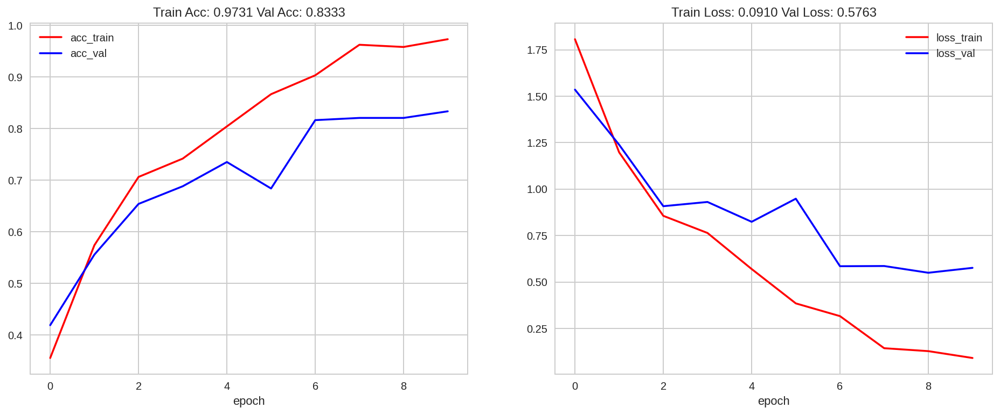

In [ ]:
model = BaselineVGG16(cls2idx=cls2idx, pretrained=True).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders_aug, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

As expected, these augmentations reduced training accuracy, as due to augmentations each epoch received slightly different samples, making it harder for the model to "memorize" them and overfit. Unfortunately, it still didn't improve validation accuracy (best accuracy was 82.5% in original model and in this model with augmented data). We might see improvement in future epochs, but in both models validation acuracy / loss plots look almost flat in the last epochs, so I wouldn't count on it.

Let's try another augmentation transformation - perhaps this time we will have more luck.

In [ ]:
data_transforms_augmentations = {
    'train': transforms.Compose([
        transforms.Resize((350, 350)),
        transforms.CenterCrop((300, 300)),
        transforms.RandomCrop((256, 256)),
        torchvision.transforms.ColorJitter(hue=.05, saturation=.05),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.RandomRotation(10, resample=PIL.Image.BILINEAR),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}

In [ ]:
# redefine the dataloades using the new trasnform

image_datasets_aug = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms_augmentations[x]) for x in ['train', 'val']}
dataloaders_aug = {
    'train': torch.utils.data.DataLoader(image_datasets_aug['train'], batch_size=16, shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets_aug['val'], batch_size=16, shuffle=False, num_workers=4)
  }

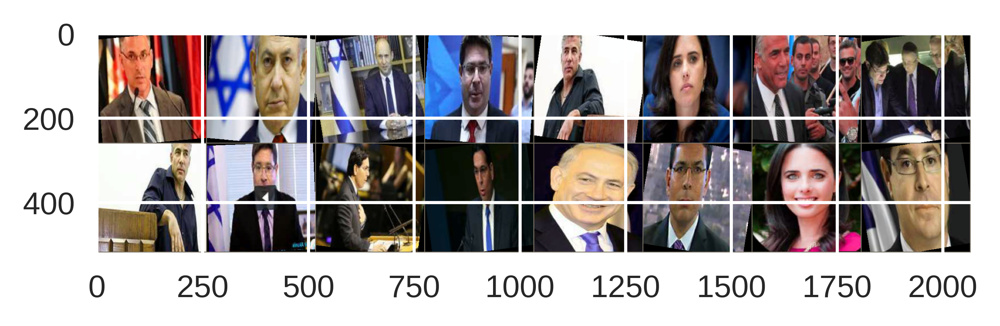

In [ ]:
inputs, classes = next(iter(dataloaders_aug['train']))
out = torchvision.utils.make_grid(inputs, nrow=8)

imshow(out)

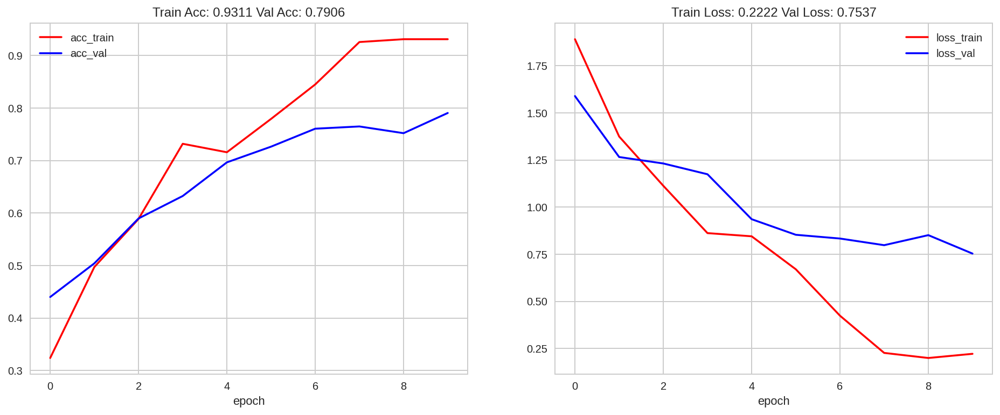

In [ ]:
model = BaselineVGG16(cls2idx=cls2idx, pretrained=True).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders_aug, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

This, more complex, augmentation makes it even harder for the training accuracy to increase, but unfortunately, it also didn't improve the validation accuracy, resulting in ~79% vs original ~83%.

## Task 7: Model Architectures
In the course we'll cover in depth various DL architectures suggested to perform image classification. Among other things, these networks differ in depth (the number of layers), the number of weights (the network power), the composing layers, and more.  
In the figure below, you can see the performance of different network architectures on the ImageNet Image Classification task, and the number of flops (atomic computations) required for them. 

![CNN performance/flops graph](https://miro.medium.com/max/1838/1*n16lj3lSkz2miMc_5cvkrA.jpeg)

In our code above we've used the `mobilenet` architecture.  
See if you can increase model performance by using alternative architectures from [torchvision.models](https://pytorch.org/vision/0.8/models.html).  
Pay attention to the input dimensions that each network architecture expects.

In [ ]:
# desired input of Resnet18 is 224x224
data_transforms_224 = {
    'train': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
    'val': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ]),
}
image_datasets_224 = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms_224[x]) for x in ['train', 'val']}
dataloaders_224 = {
    'train': torch.utils.data.DataLoader(image_datasets_224['train'], batch_size=16, shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets_224['val'], batch_size=16, shuffle=False, num_workers=4)
  }

In [ ]:
class MobileNetv2Model(AbstractModel):
  def __init__(self, cls2idx, *args, **kwargs):
    super(MobileNetv2Model, self).__init__(cls2idx, *args, **kwargs)
    self.detector = models.mobilenet_v2(pretrained=True)
    last_layer = list(self.detector.children())[-1]
    if hasattr(last_layer, 'in_features'):
        num_ftrs = last_layer.in_features
    else:
        num_ftrs = last_layer[-1].in_features
    if self.feature_extracting:
      self.__freeze_pretrained__()
    self.detector.classifier[1] = nn.Linear(num_ftrs, len(class_names))

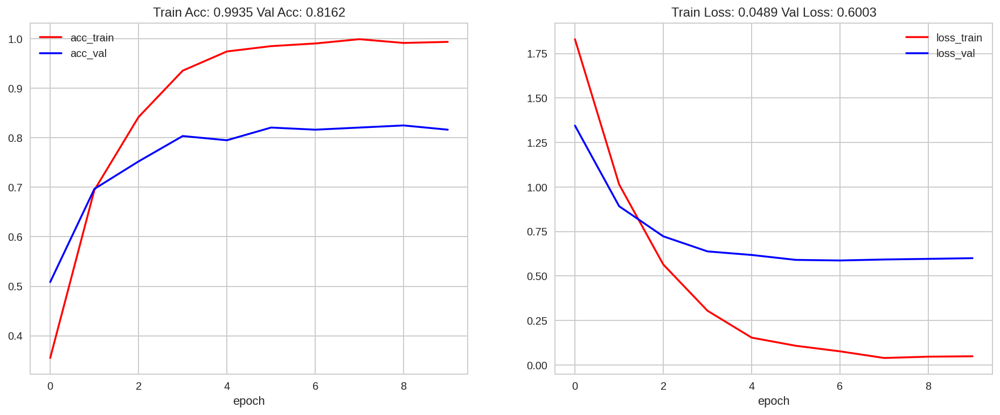

In [ ]:
model = MobileNetv2Model(cls2idx=cls2idx).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders_224, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

In [ ]:
class Resenet50Model(AbstractModel):
  def __init__(self, cls2idx, *args, **kwargs):
    super(Resenet50Model, self).__init__(cls2idx, *args, **kwargs)
    self.detector = models.wide_resnet50_2(pretrained=True)
    last_layer = list(self.detector.children())[-1]
    if hasattr(last_layer, 'in_features'):
        num_ftrs = last_layer.in_features
    else:
        num_ftrs = last_layer[-1].in_features
    if self.feature_extracting:
      self.__freeze_pretrained__()
    self.detector.fc = nn.Linear(num_ftrs, len(class_names))

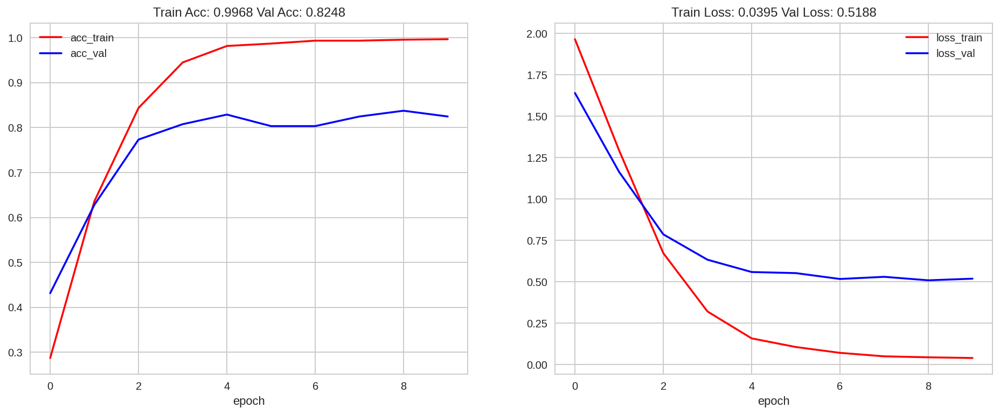

In [ ]:
model = Resenet50Model(cls2idx=cls2idx).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

In [ ]:
class Inception3Model(AbstractModel):
  def __init__(self, cls2idx, *args, **kwargs):
    super(Inception3Model, self).__init__(cls2idx, *args, **kwargs)
    self.detector = models.inception_v3(pretrained=True)
    self.detector.aux_logits=False  # we don't process aux_loss on the train stage
    last_layer = list(self.detector.children())[-1]
    if hasattr(last_layer, 'in_features'):
        num_ftrs = last_layer.in_features
    else:
        num_ftrs = last_layer[-1].in_features
    if self.feature_extracting:
      self.__freeze_pretrained__()
    # we change classifier after freezing, hence last layer should be trainable
    self.detector.fc = nn.Linear(num_ftrs, len(cls2idx))

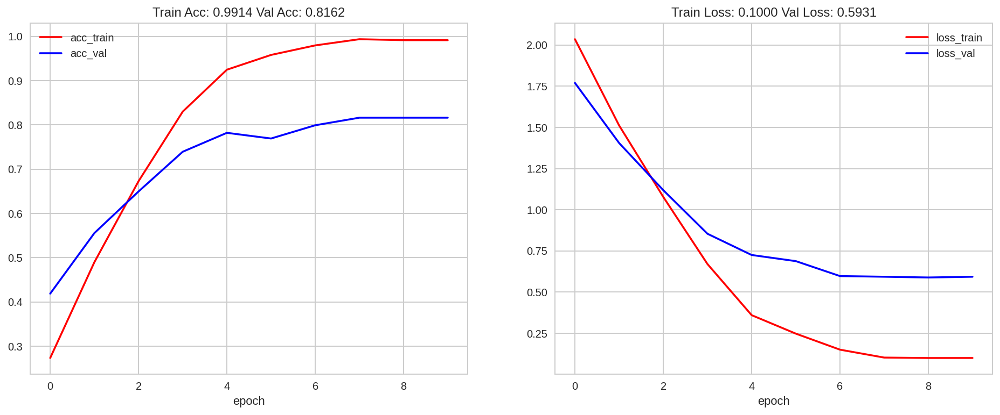

In [ ]:
def run_inception_experiment():
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]

    data_transforms = {
        'train': transforms.Compose([
            transforms.Resize((299, 299)),
            transforms.ToTensor(),
            transforms.Normalize(means, stds)
        ]),
        'val': transforms.Compose([
            transforms.Resize((299, 299)),
            transforms.ToTensor(),
            transforms.Normalize(means, stds)
        ]),
    }

    data_dir = r'./data/israeli_politicians/'

    image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                              data_transforms[x])
                      for x in ['train', 'val']}
    dataloaders = {
        'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                                shuffle=True, num_workers=4),
        'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                              shuffle=False, num_workers=4)
      }
    dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
    print('dataset_sizes: ', dataset_sizes)

    class_names = image_datasets['train'].classes
    print('class_names:', class_names)


    model = Inception3Model(cls2idx=cls2idx).to(device)
    optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
    criterion = nn.CrossEntropyLoss()
    num_epochs = 10
    history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)
    return model, history

run_inception_experiment();

Using much smaller models witl less parameters, we have managed to reach similiar validation accuracy

## Task 8: Design your own Neural Network Architecture
Take a stab at building your own NN architecture.  
To allow you to experiment quickly, we'll limit it to 8 layers max, and up to 10 million parameters. Use [this PyTorch guide](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html) for reference.  
Train it only on our provided images - we'll present the winner with the best results on the validation set!

In [ ]:
class RakBibiNet(AbstractModel):
    def __init__(self, cls2idx, *args, **kwargs):
        super(RakBibiNet, self).__init__(cls2idx, *args, **kwargs)
        self.cls2idx = cls2idx
        self.num_classes = len(cls2idx)
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(512, 512),
            nn.ReLU(inplace=True),
            nn.Linear(512, self.num_classes),
        )
        self.init_weights(self.features.modules())
        self.init_weights(self.classifier.modules())
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

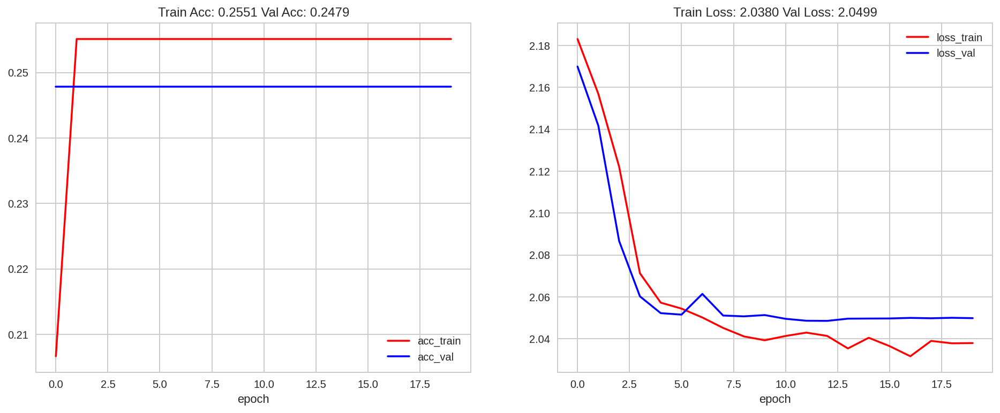

In [ ]:
model = RakBibiNet(cls2idx=cls2idx).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 20
history = model.fit(dataloaders_aug, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

In [ ]:
model.summary()

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 63, 63]          23,296
              ReLU-2           [-1, 64, 63, 63]               0
         MaxPool2d-3           [-1, 64, 31, 31]               0
            Conv2d-4          [-1, 192, 31, 31]         307,392
              ReLU-5          [-1, 192, 31, 31]               0
         MaxPool2d-6          [-1, 192, 15, 15]               0
            Conv2d-7          [-1, 384, 15, 15]         663,936
              ReLU-8          [-1, 384, 15, 15]               0
            Conv2d-9          [-1, 256, 15, 15]         884,992
             ReLU-10          [-1, 256, 15, 15]               0
           Conv2d-11          [-1, 256, 15, 15]         590,080
             ReLU-12          [-1, 256, 15, 15]               0
        MaxPool2d-13            [-1, 256, 7, 7]               0
AdaptiveAvgPool2d-14            [-1, 25

Unfortunately, our model is "stuck" and does not improve over ~25%

# Task 9: Experiments

1. new without batch-normalization model, without pretrained weights

In [ ]:
%%capture
!pip install git+https://github.com/rwightman/pytorch-image-models

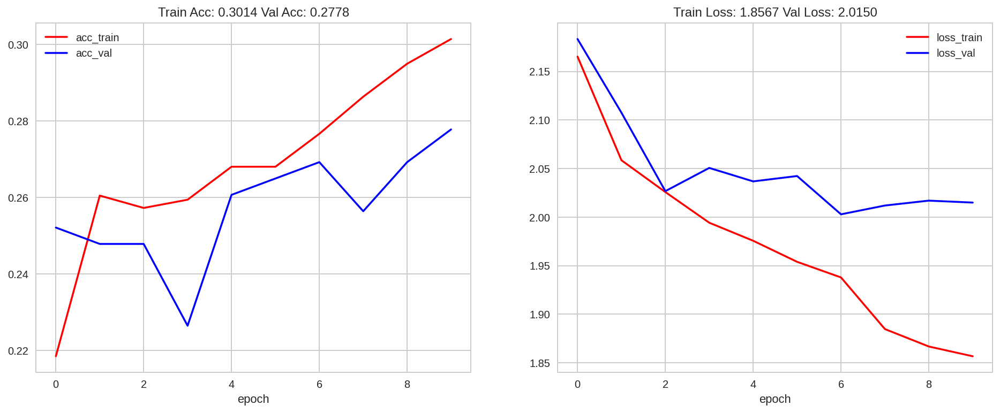

In [ ]:
import timm

class NFNetModel(AbstractModel):
    def __init__(self, cls2idx, *args, **kwargs):
        super(NFNetModel, self).__init__(cls2idx, *args, **kwargs)
        self.cls2idx = cls2idx
        self.detector = timm.create_model('nfnet_f1', pretrained=self.pretrained)
        self.detector.head.fc = nn.Linear(self.detector.head.fc.in_features, len(cls2idx))

model = NFNetModel(cls2idx=cls2idx).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

it's a bit better then our rakbibi model. everything is better then rakbibi

2. Label smoothing

In [ ]:
class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self):
        super(LabelSmoothingCrossEntropy, self).__init__()
    def forward(self, x, target, smoothing=0.1):
        confidence = 1. - smoothing
        logprobs = F.log_softmax(x, dim=-1)
        nll_loss = -logprobs.gather(dim=-1, index=target.unsqueeze(1))
        nll_loss = nll_loss.squeeze(1)
        smooth_loss = -logprobs.mean(dim=-1)
        loss = confidence * nll_loss + smoothing * smooth_loss
        return loss.mean()

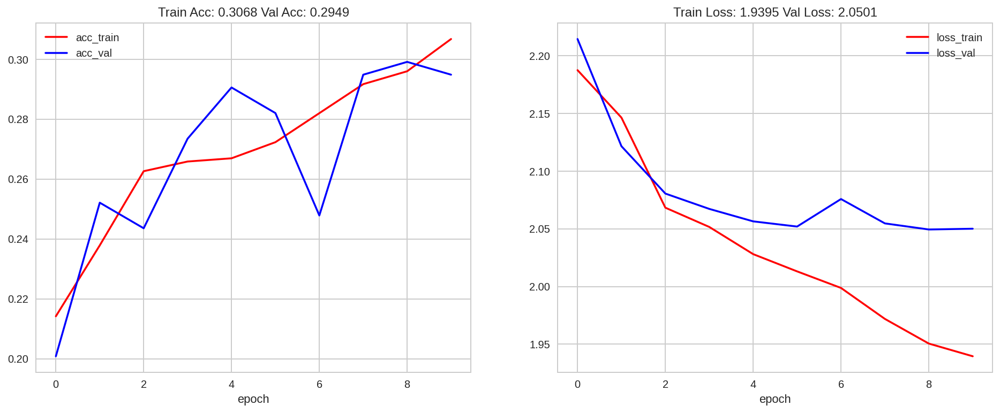

In [ ]:
model = NFNetModel(cls2idx=cls2idx).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = LabelSmoothingCrossEntropy()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

3. mixup

In [ ]:
@torch.no_grad()
def mixup(alpha, data, target):
      bs = data.size(0)
      c = np.random.beta(alpha, alpha)

      perm = torch.randperm(bs).cuda()

      md = c * data + (1 - c) * data[perm, :]
      mt = c * target + (1 - c) * target[perm]
      return md, mt


class MixUpWrapper(object):
    def __init__(self, alpha, dataloader):
        self.alpha = alpha
        self.dataloader = dataloader

    def mixup_loader(self, loader):
        for input, target in loader:
            i, t = mixup(self.alpha, input, target)
            yield i, t.long()

    def __iter__(self):
        return self.mixup_loader(self.dataloader)

    def __len__(self):
        return len(self.dataloader)

In [ ]:
dataloaders["train"] = MixUpWrapper(0.1, dataloaders["train"])

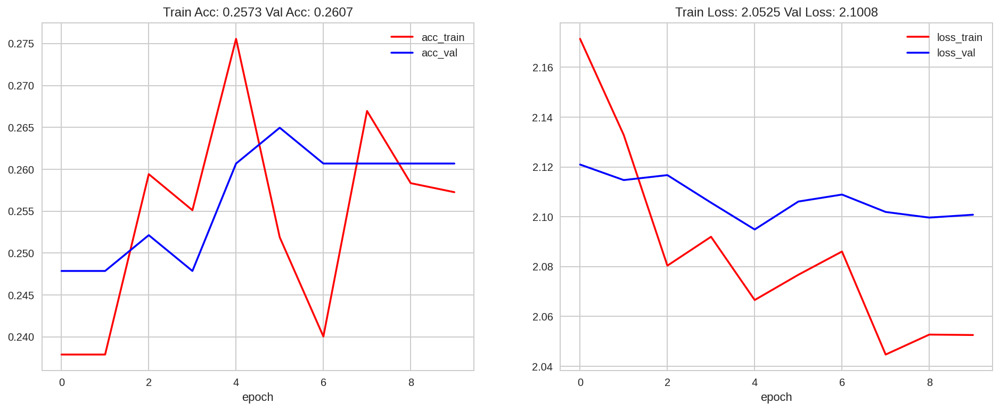

In [ ]:
model = NFNetModel(cls2idx=cls2idx).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = LabelSmoothingCrossEntropy()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

4. using only faces, we preprocessed images and extrated only faces (there are a lot of way to do it, using face detector pretrained model or using opencv cascade classifier, we use first way, but is out of scope notebook and we decided do not provide a code for that)

In [ ]:
!gdown https://drive.google.com/uc?id=1Wl9l9I4xGAQSsf8cUSJAkJgaOK8Rt9d6
!unzip /content/data_cropped.zip

Downloading...
From: https://drive.google.com/uc?id=1Wl9l9I4xGAQSsf8cUSJAkJgaOK8Rt9d6
To: /content/data_cropped.zip
4.01MB [00:00, 129MB/s]


In [ ]:
data_dir = r'./data_cropped/'

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {
    'train': torch.utils.data.DataLoader(image_datasets['train'], batch_size=16,
                                             shuffle=True, num_workers=4),
    'val': torch.utils.data.DataLoader(image_datasets['val'], batch_size=16,
                                          shuffle=False, num_workers=4)
  }
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print('dataset_sizes: ', dataset_sizes)

class_names = image_datasets['train'].classes
print('class_names:', class_names)

dataset_sizes:  {'train': 919, 'val': 223}
class_names: ['ayelet_shaked', 'benjamin_netanyahu', 'benny_gantz', 'danny_danon', 'gideon_saar', 'kostya_kilimnik', 'naftali_bennett', 'ofir_akunis', 'yair_lapid']


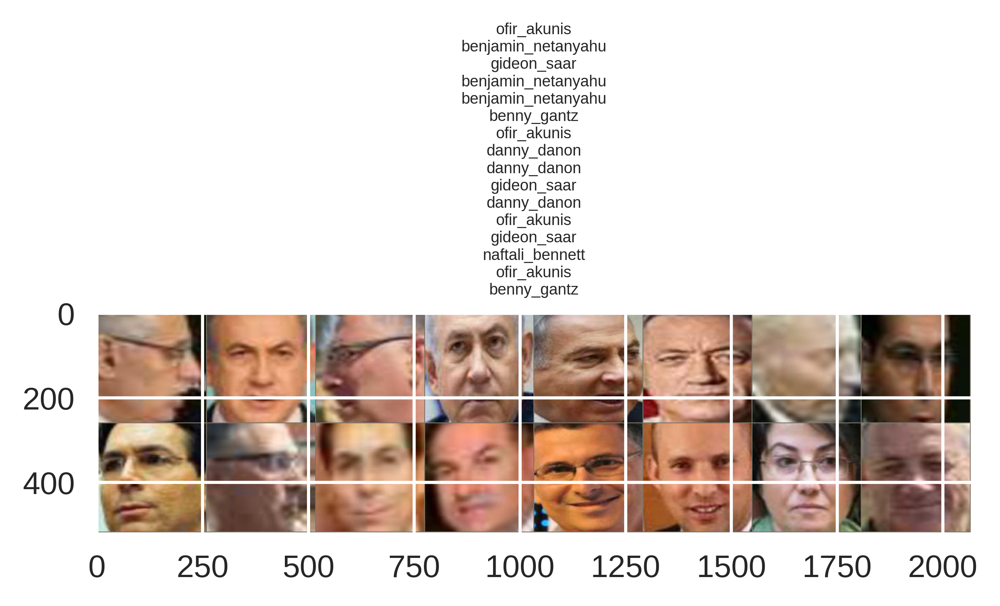

In [ ]:
inputs, classes = next(iter(dataloaders['train']))
out = torchvision.utils.make_grid(inputs, nrow=8)

imshow(out, title='\n'.join([class_names[x] for x in classes]))

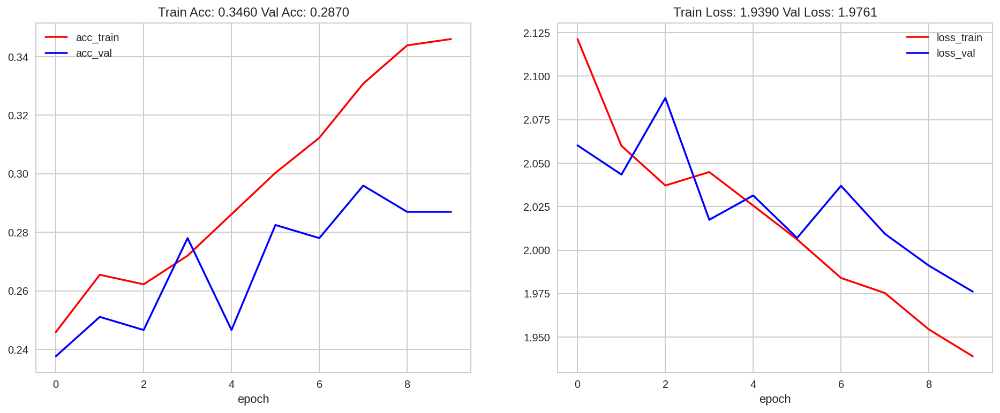

In [ ]:
model = NFNetModel(cls2idx=cls2idx).to(device)
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = LabelSmoothingCrossEntropy()
num_epochs = 10
history = model.fit(dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=num_epochs)

as we see, we improved our results a bit, almost 0.3;)

5. also we tried - images from google search with good quality, removing photos where several faces. 